# Figure 3 and 4 Notebook

# Load libraries

In [3]:
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import scipy.stats as stats
from sklearn import preprocessing
import statsmodels.api as sm
import warnings
warnings.simplefilter('ignore')
pd.set_option('display.max_columns', 25)
savepath = '../../output_file/scanpy/all_pbmc/pbmc260k.h5ad'
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Read data

In [4]:
%matplotlib inline
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
adata = sc.read(savepath, cache=True)
figdir = "./F3_4/"
sc.settings.figdir = figdir
print('Processed dataset: {}'.format(adata))

Processed dataset: AnnData object with n_obs × n_vars = 263612 × 2500
    obs: 'sample', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [33]:
meta =  pd.read_csv('../../final/seurat/pbmc/02-pbmc_filter_cluster_main_type.meta.csv')

In [35]:
meta['bridge_index'] = meta['Unnamed: 0'].str.split('-').str.get(0) + '_' + meta['orig.ident']
meta['bridge_index'] 

0         AAACCTGAGAAGGTGA_GW
1         AAACCTGAGCTCCTTC_GW
2         AAACCTGAGCTGCGAA_GW
3         AAACCTGAGCTTCGCG_GW
4         AAACCTGAGGAATCGC_GW
                 ...         
252116    TTTGTCATCGCGCCAA_ZS
252117    TTTGTCATCGGCGCAT_ZS
252118    TTTGTCATCTCTGCTG_ZS
252119    TTTGTCATCTGACCTC_ZS
252120    TTTGTCATCTGAGGGA_ZS
Name: bridge_index, Length: 252121, dtype: object

In [26]:
adata.obs['bridge_index'] = adata.obs.index.to_series().str.split('-').str.get(0) + '_' + adata.obs['sample'].astype('string')

In [36]:
adata.obs['bridge_index'].isin(meta['bridge_index']).value_counts()

True     236286
False     27326
Name: bridge_index, dtype: int64

In [37]:
adata = adata[adata.obs['bridge_index'].isin(meta['bridge_index'])].copy()


In [43]:
tmp =  adata.obs.merge(meta,on='bridge_index')
tmp.index = adata.obs.index
adata.obs = tmp

In [47]:
adata.obs.main_type

AAACCTGAGGACTGGT-1-0        T.cyto
AAACCTGAGGTGTTAA-1-0       T.naive
AAACCTGAGTCAATAG-1-0        T.cyto
AAACCTGAGTTATCGC-1-0       T.naive
AAACCTGCAAAGGTGC-1-0       T.naive
                           ...    
TTTGTCATCACCTCGT-1-21      T.naive
TTTGTCATCCTTTCGG-1-21       T.cyto
TTTGTCATCGCGTTTC-1-21    T.prolife
TTTGTCATCGTCGTTC-1-21      T.naive
TTTGTCATCTGCCCTA-1-21       T.cyto
Name: main_type, Length: 236286, dtype: object

# Plot cell types

In [51]:
colors = ["#4E79A7","#A0CBE8","#8CD17D","#499894","#F28E2B","#FFBE7D","#B6992D","#E15759","#FF9D9A",
           "#D37295","#FABFD2", '#B07AA1',"#B07AA1","#D4A6C8","#9D7660","#E58606", "#5D69B1", "#24796C",
           '#DAA51B', '#000000', '#99C945', '#ED645A']



... storing 'orig.ident' as categorical
... storing 'group' as categorical
... storing 'treatment' as categorical
... storing 'pair' as categorical
... storing 'Phase' as categorical
... storing 'old.ident' as categorical
... storing 'PIC' as categorical


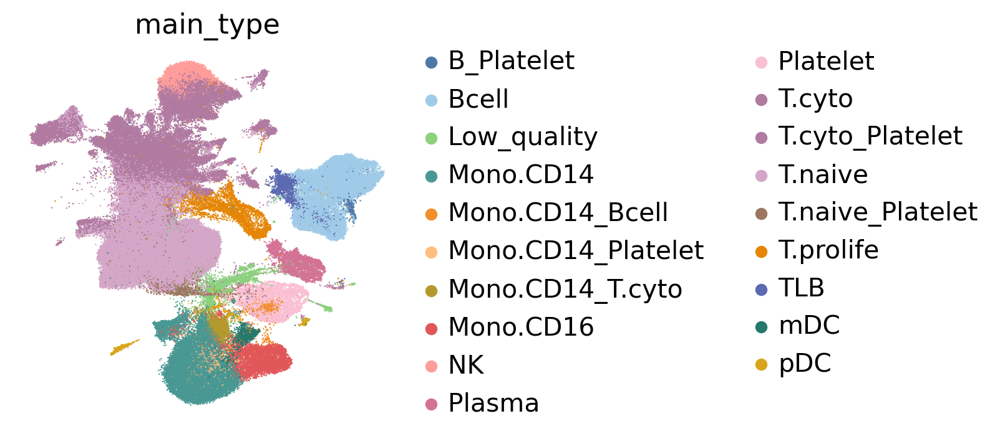

In [52]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
adata.obs['main_type'] = adata.obs['main_type'].astype('category')
# adata.obs['cg_cov'] = adata.obs['cg_cov'].cat.reorder_categories(MasterORDER)
adata.uns['main_type_colors'] = colors
cellgroups_umap = sc.pl.umap(adata, color='main_type', show=True, size=3, edgecolor="none")

# Generate Functions

In [53]:
def get_pseudobulk(adata, save=False, load=False, savetitle=""):
    if load == True:
        pseudobulk = pd.read_csv(savetitle, index_col=0)
    else:
        genes = adata.raw.var_names.tolist()
        people = np.unique(adata.obs['ind_cov'].tolist())
        pseudobulk = pd.DataFrame(index=genes, columns=people)
        for ii in range(len(people)):
            fdata = adata[adata.obs['ind_cov'] == people[ii]]
            pseudobulk[people[ii]] = np.ravel(np.sum(fdata.raw.X, axis=0)/np.sum(fdata.raw.X))
        if save == True:
            pseudobulk.to_csv(savetitle)
    return pseudobulk


def make_volcanoplot(tmp, title, save=False, savetitle=""):
    pval_cutoff = np.log10(0.05)*-1
    logFC_cutoff = 0.5
    
    tmp['adj.pvalue'] = np.log10(tmp['adj.pvalue'])*-1
    SIG = tmp.loc[(tmp['adj.pvalue'] > pval_cutoff) & (np.abs(tmp['log2FoldChange']) > logFC_cutoff)]
    NotSIG = tmp.loc[(tmp['adj.pvalue'] <= pval_cutoff) & (np.abs(tmp['log2FoldChange']) <= logFC_cutoff)]
    NotSIG2 = tmp.loc[(tmp['adj.pvalue'] > pval_cutoff) & (np.abs(tmp['log2FoldChange']) <= logFC_cutoff)]
    NotSIG3 = tmp.loc[(tmp['adj.pvalue'] <= pval_cutoff) & (np.abs(tmp['log2FoldChange']) > logFC_cutoff)]
    NotSIG = pd.concat([NotSIG, NotSIG2, NotSIG3], axis=0)
    SIG = SIG.reset_index()

    # Plot significant values
    sns.scatterplot(x='log2FoldChange', y='adj.pvalue', data=SIG, color='#a1caf1')
    for tex in SIG['index'].tolist():
        plt.text(SIG[SIG['index']==tex]['log2FoldChange'].values[0], 
                 SIG[SIG['index']==tex]['adj.pvalue'].values[0], s=tex, fontsize=3)

    # Plot nonsignificant values
    sns.scatterplot(x='log2FoldChange', y='adj.pvalue', data=NotSIG, color=[0.5, 0.5, 0.5], alpha=0.2)

    plt.xlabel('Log2 Fold Change')
    plt.ylabel('-Log10 adjusted p-value')
    plt.title('Volcano plot: {}'.format(title))
    if save == True:
        plt.savefig(figdir+'/'+'{}.pdf'.format(savetitle), bbox_inches='tight')
    URG = SIG[SIG['log2FoldChange']>0]['index'].tolist()
    DRG = SIG[SIG['log2FoldChange']<0]['index'].tolist()
    return URG, DRG    

# Generate pseudobulk based on raw counts

In [6]:
X = adata.raw.X
obs = pd.DataFrame()
obs['SLE_status'] = adata.obs['SLE_status'].tolist()
obs['ind_cov'] = adata.obs['ind_cov'].tolist()
obs['batch_cov'] = adata.obs['batch_cov'].tolist()
obs['pop_cov'] = adata.obs['pop_cov'].tolist()
obs['cg_cov'] = adata.obs['cg_cov'].tolist()
obs['ct_cov'] = adata.obs['ct_cov'].tolist()
obs['Age'] = adata.obs['Age'].tolist()
obs['Processing_Cohort'] = adata.obs['Processing_Cohort'].tolist()
obs['L3'] = adata.obs['L3'].tolist()
var_names = adata.raw.var_names.tolist()
var = pd.DataFrame(index=var_names)
cdata = ad.AnnData(X, obs=obs, var=var, dtype='int32')
cdata.raw = cdata
print('Dataset: {}'.format(cdata))
del adata


Dataset: AnnData object with n_obs × n_vars = 1263676 × 32738
    obs: 'SLE_status', 'ind_cov', 'batch_cov', 'pop_cov', 'cg_cov', 'ct_cov', 'Age', 'Processing_Cohort', 'L3'


# Differentially Expressed Genes PBMCs

## Asian population

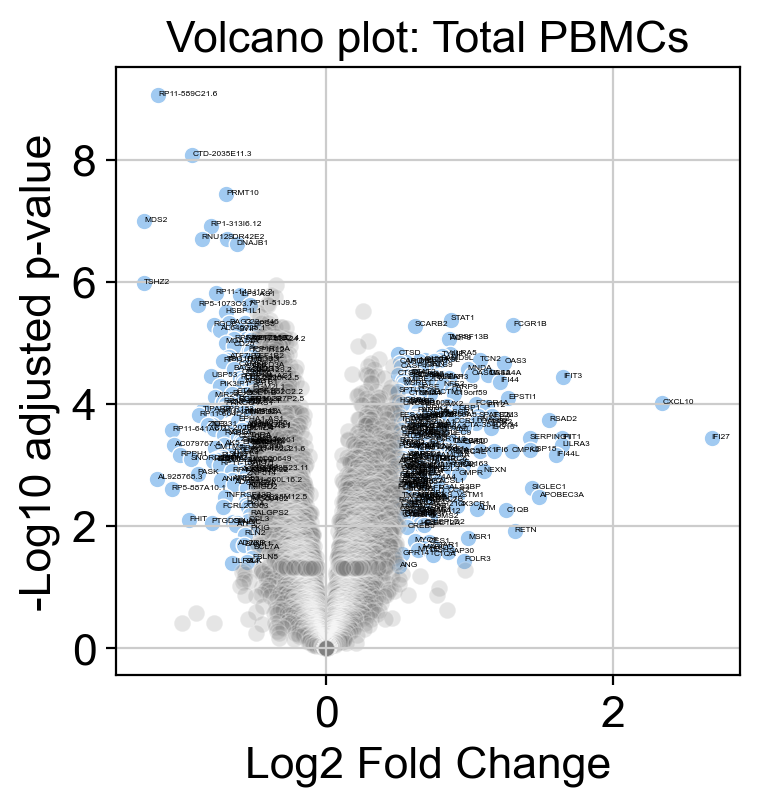

In [7]:
tmp = pd.read_csv('deseq2_l3_voom/PBMC.Asian.1.edger.txt', index_col=0)
URG_total_Asian_comp, DRG_total_Asian_comp = make_volcanoplot(tmp, title='Total PBMCs', save=True, savetitle="Total PBMC Volcano Plot Asian")


## European population

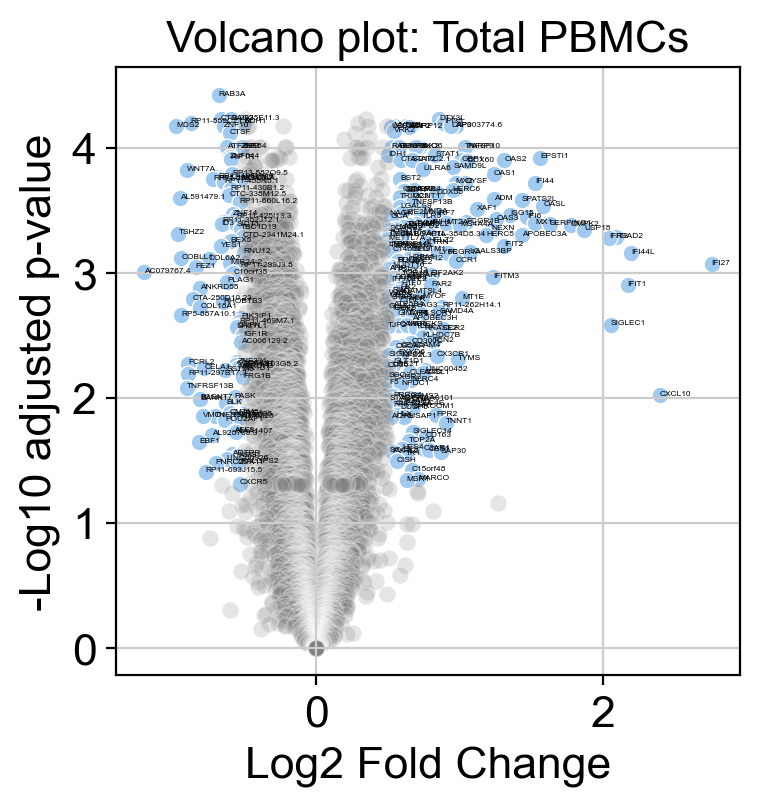

In [8]:
tmp = pd.read_csv('deseq2_l3_voom/PBMC.European.1.edger.txt', index_col=0)
URG_total_Euro_comp, DRG_total_Euro_comp = make_volcanoplot(tmp, title='Total PBMCs', save=True, savetitle="Total PBMC Volcano Plot Euro")

# Differential Expression for each subpopulation

## Asian population

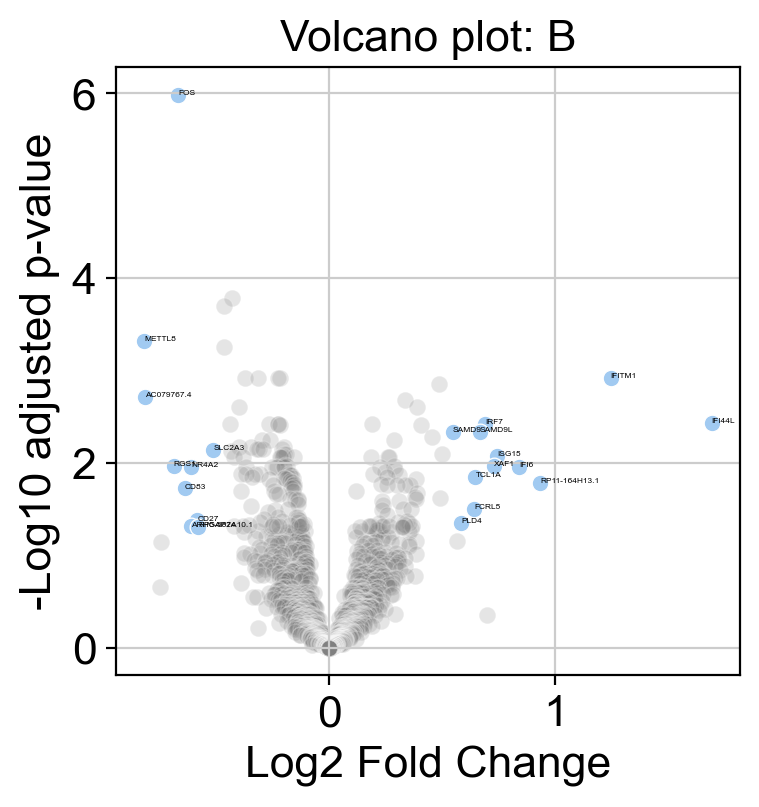

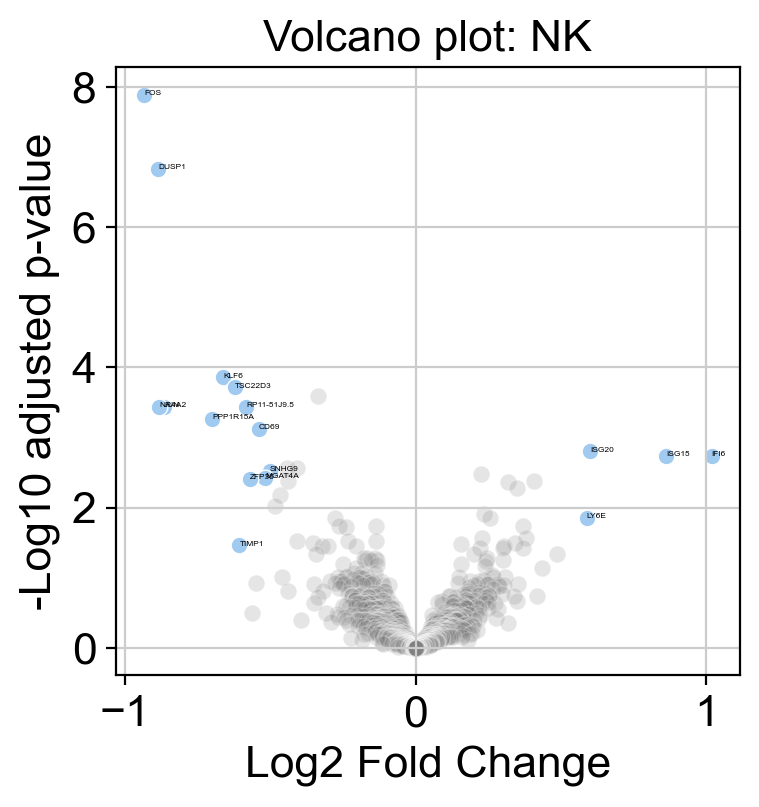

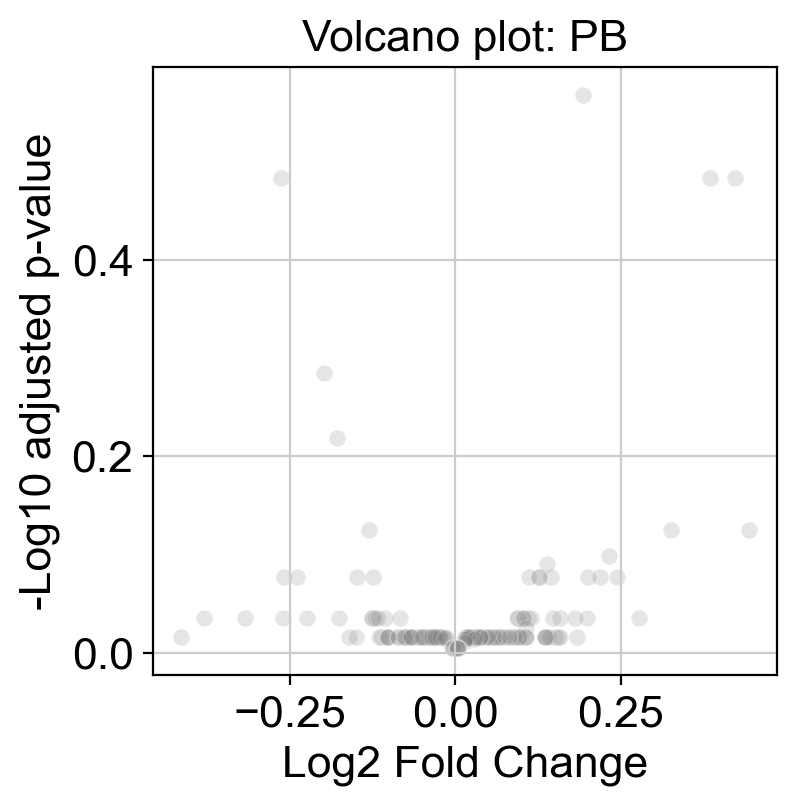

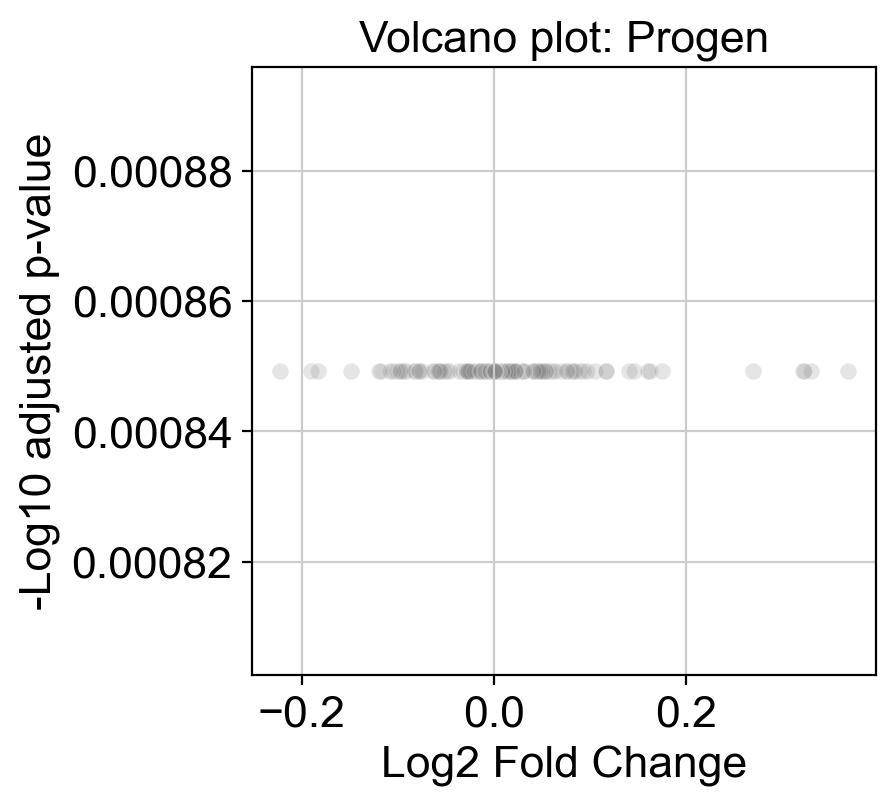

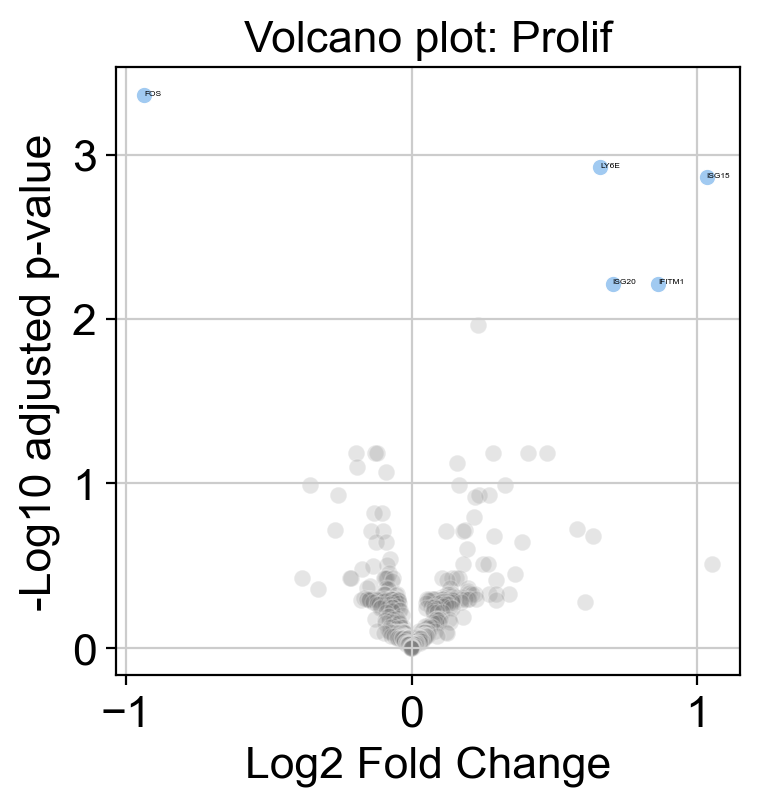

...

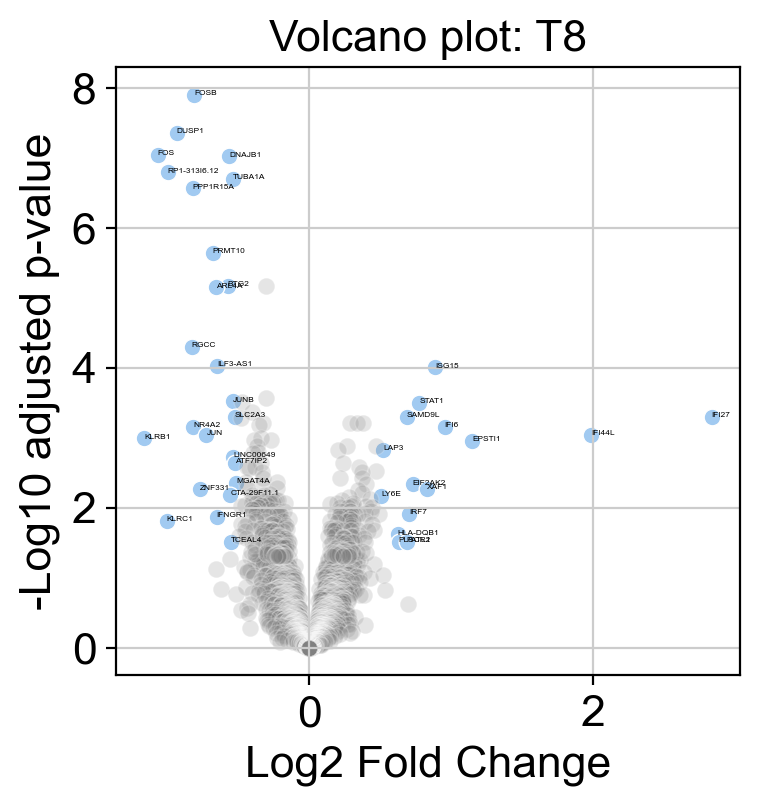

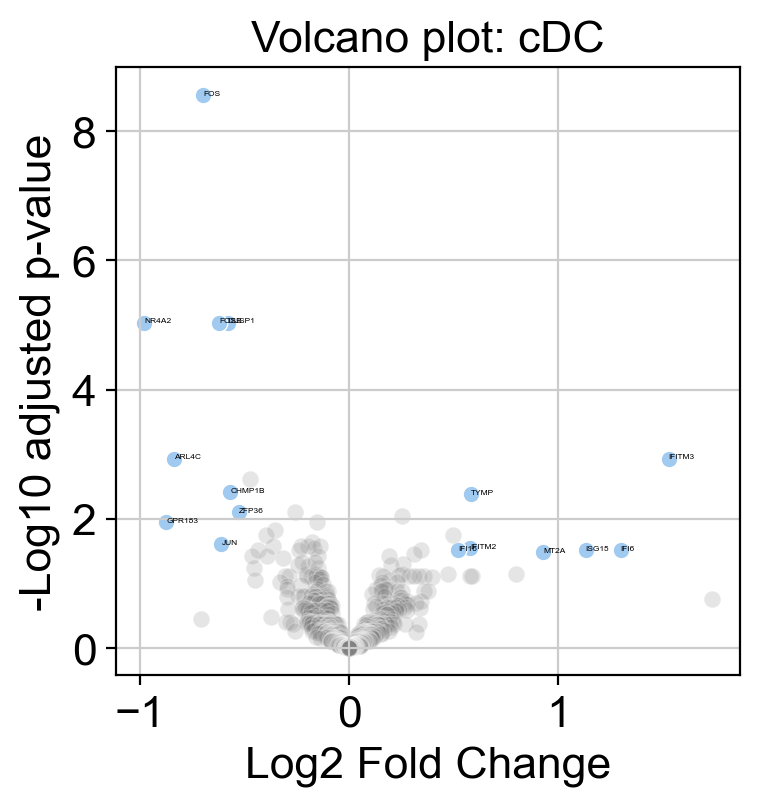

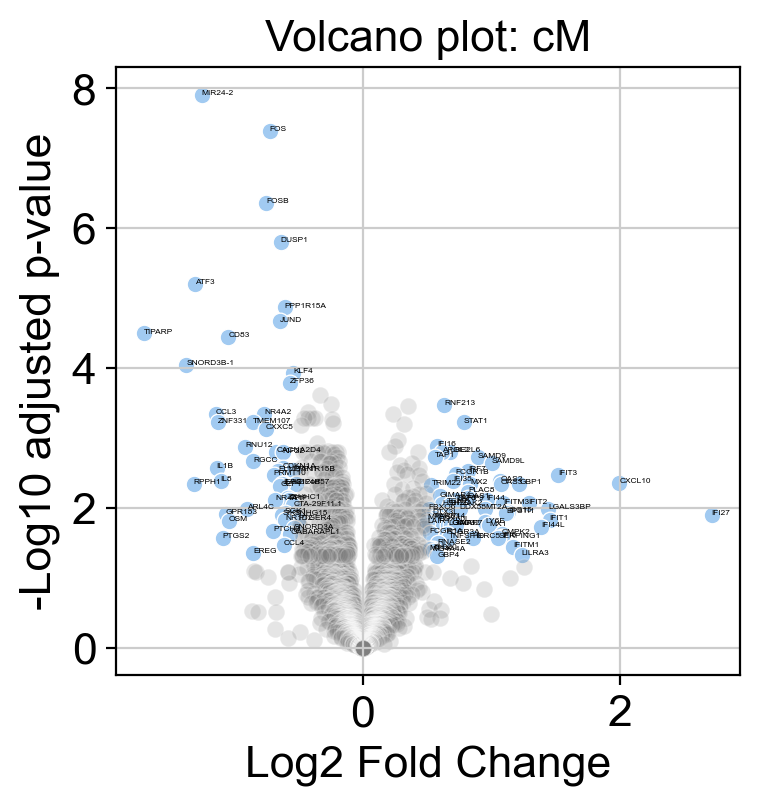

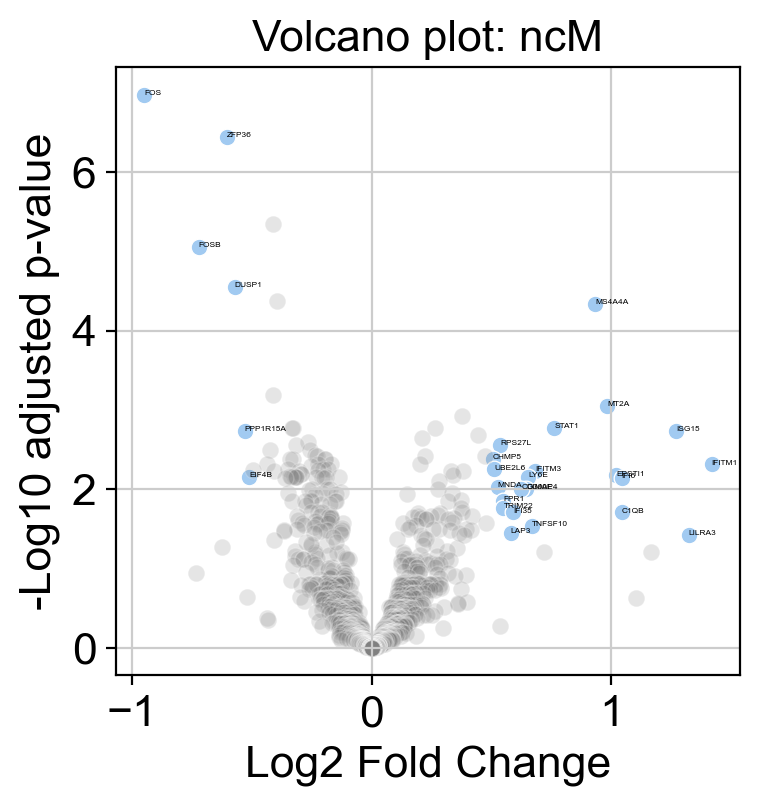

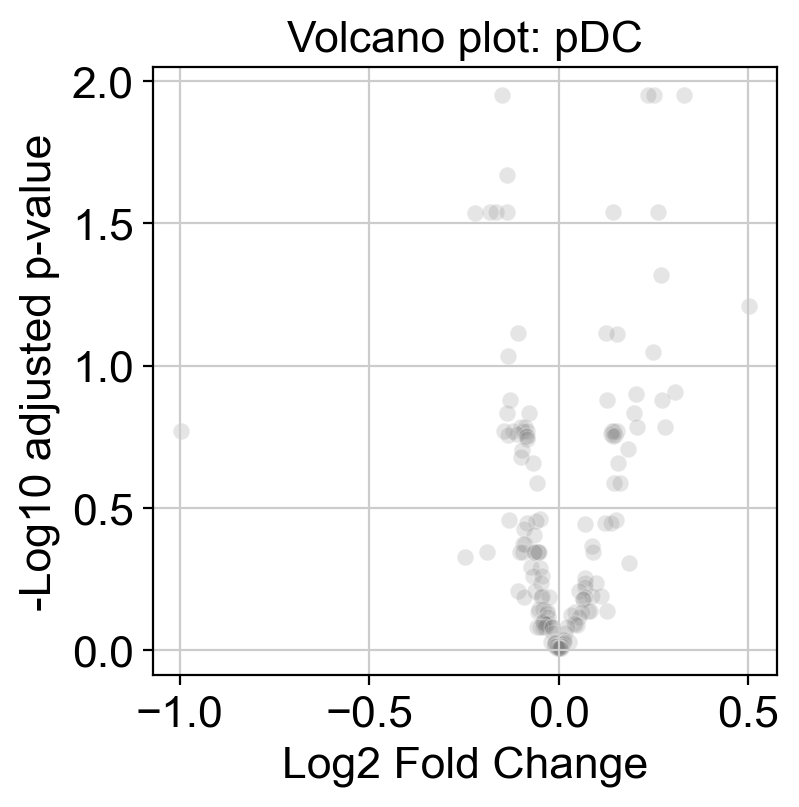

In [9]:
URG_Asian = {}; DRG_Asian = {}; # Up and Down Regulated Genes for each population
cg_groups = np.unique(cdata.obs['cg_cov'].tolist())
for ii in range(len(cg_groups)):
    tmp = pd.read_csv('deseq2_l3_voom/{0}_cg.{1}.1.edger.txt'.format(cg_groups[ii], 'Asian'), index_col=0)
    plt.figure()
    URG_Asian[cg_groups[ii]], DRG_Asian[cg_groups[ii]] = make_volcanoplot(tmp, cg_groups[ii], save=True, 
                                        savetitle="{} Volcano Plot Asian".format(cg_groups[ii]))  

## European population

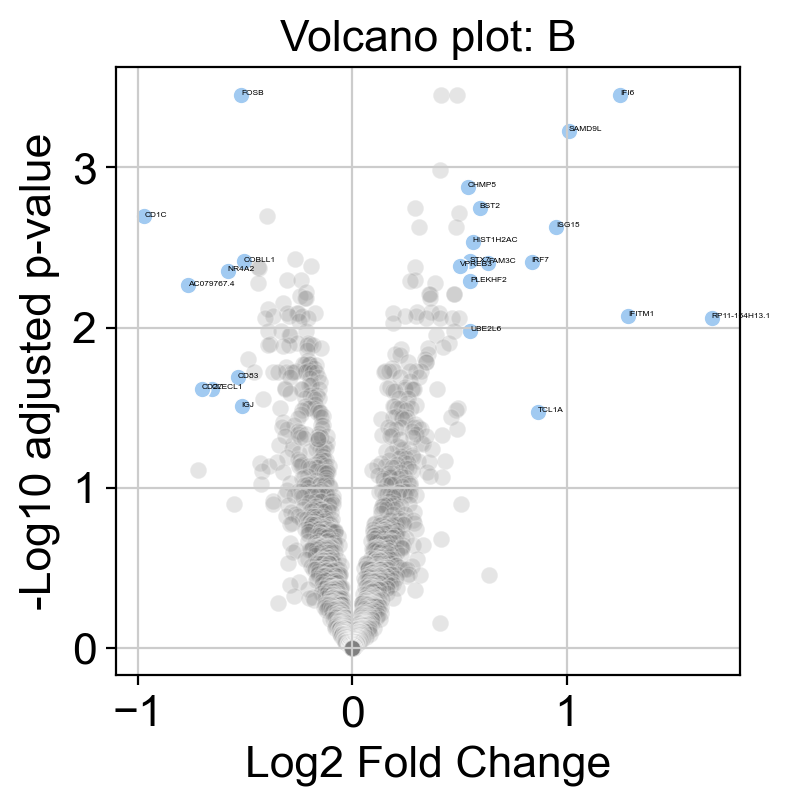

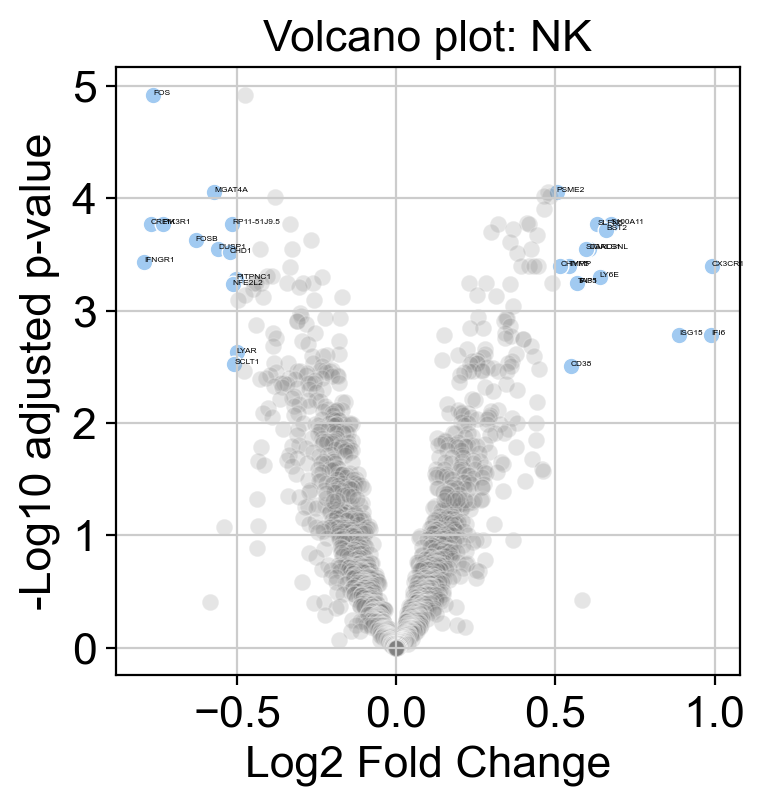

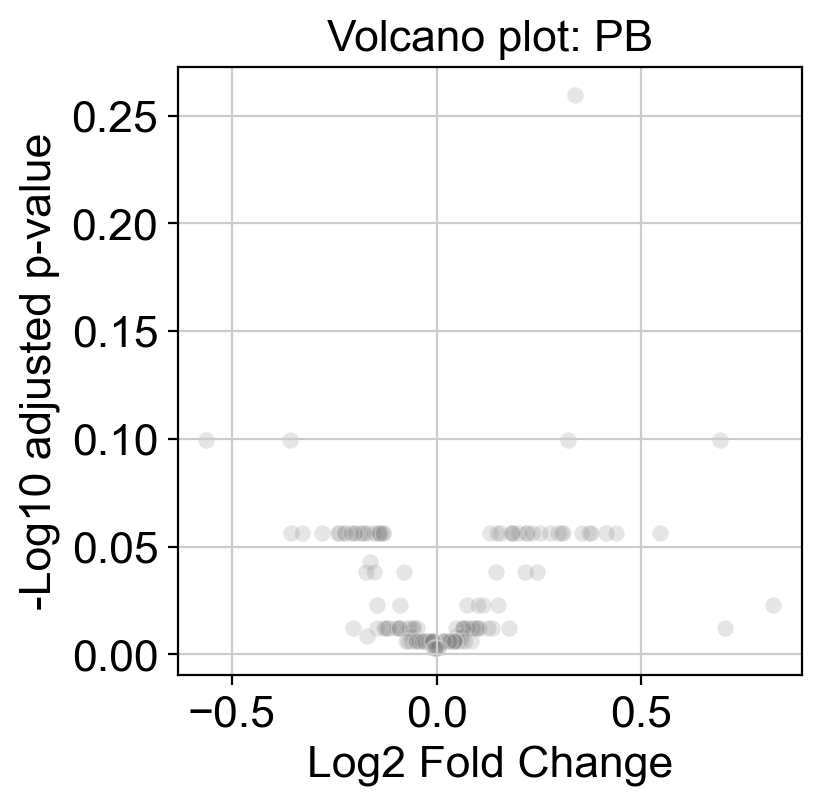

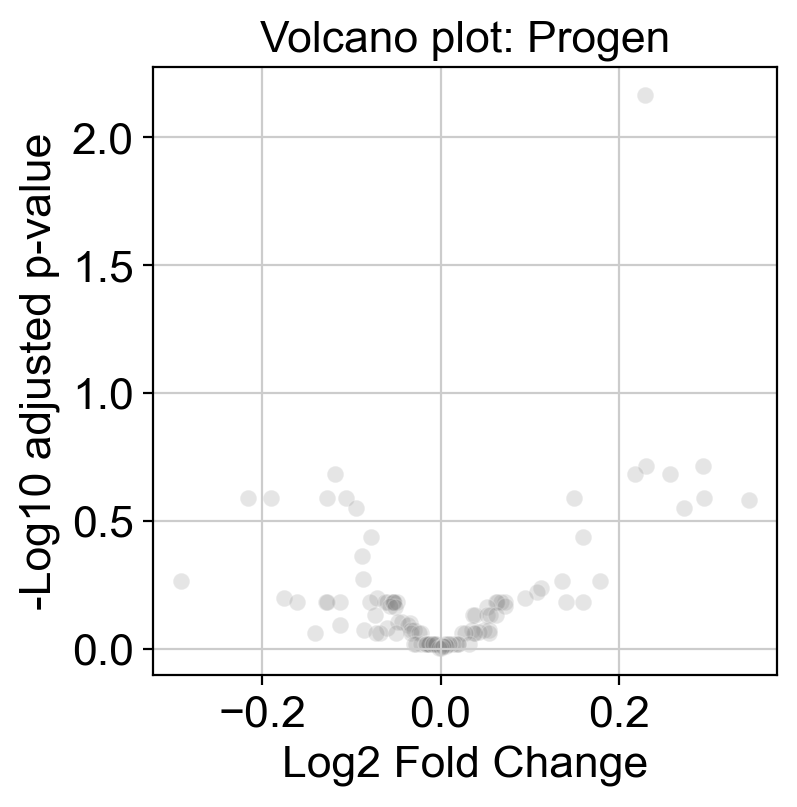

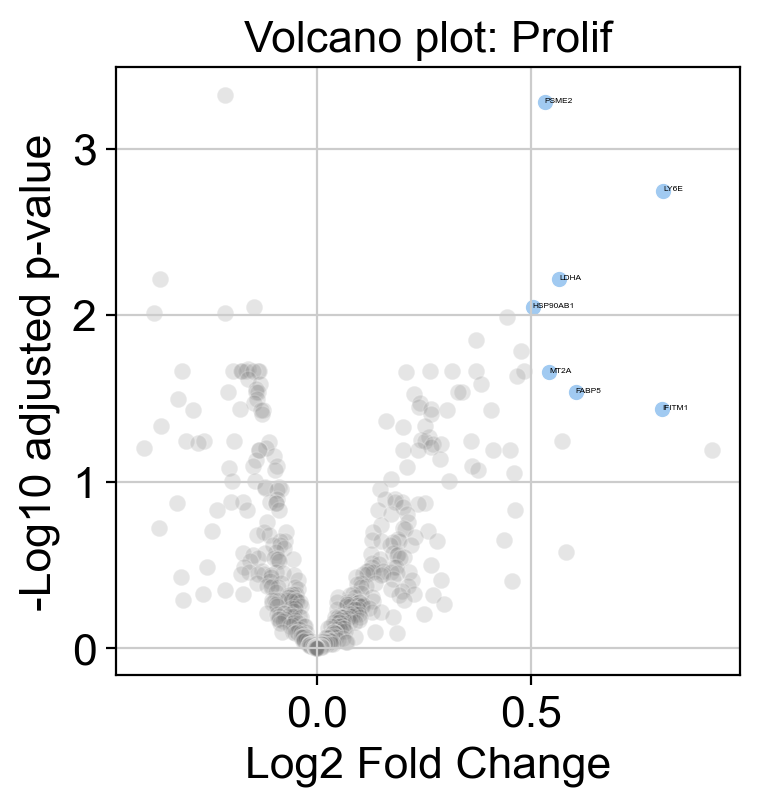

...

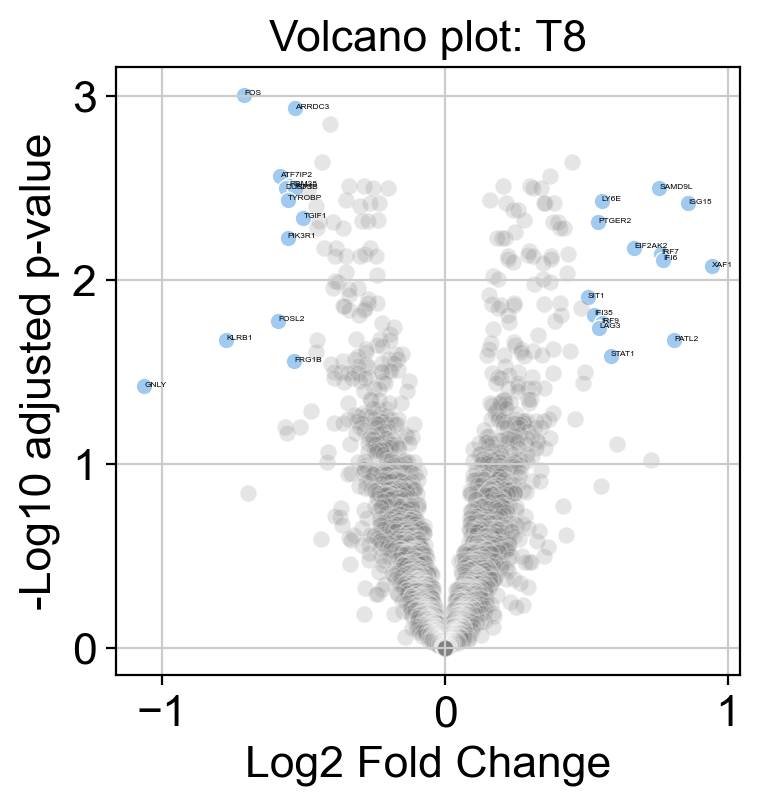

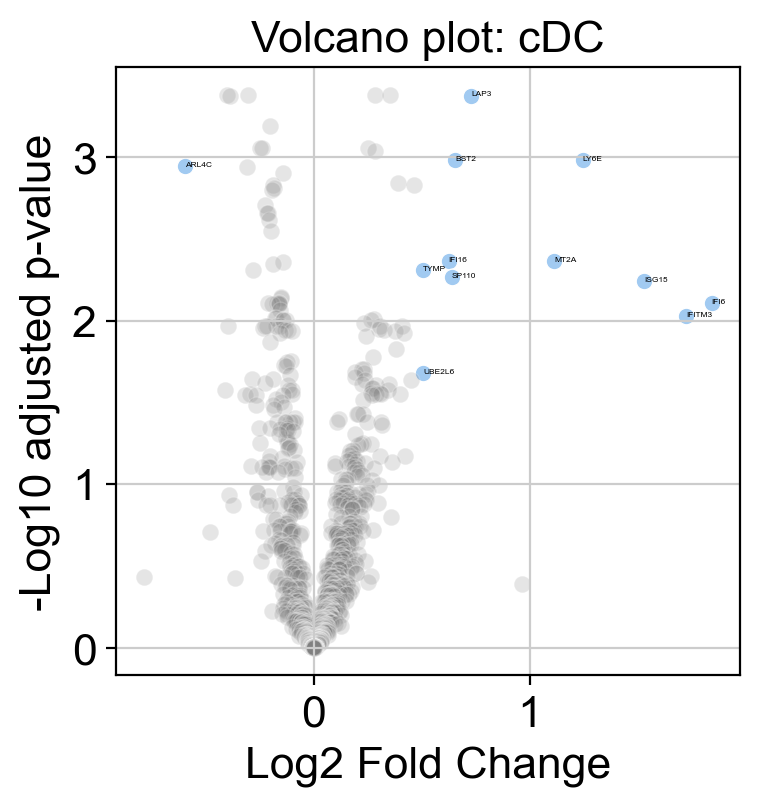

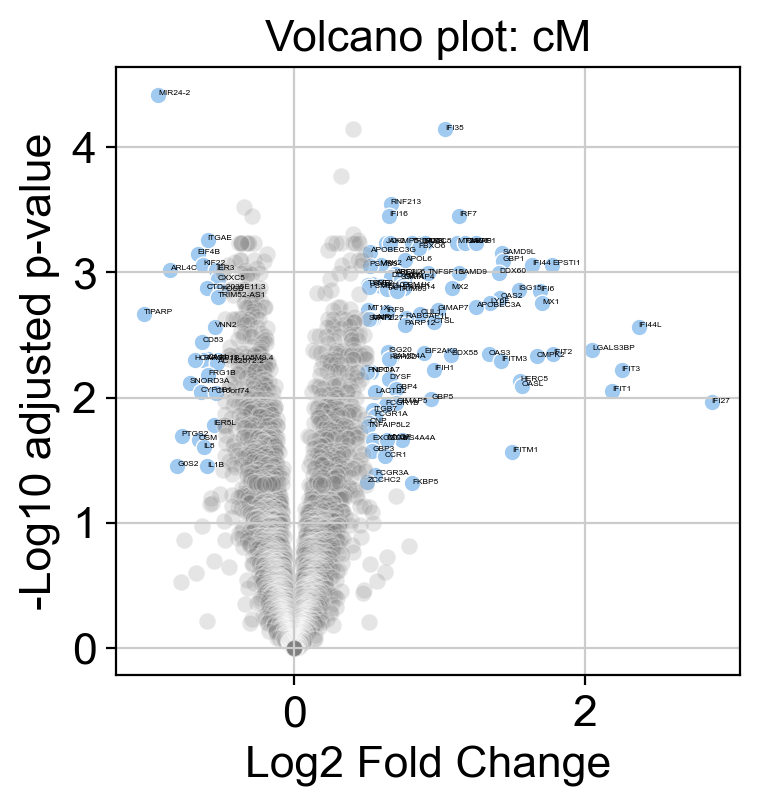

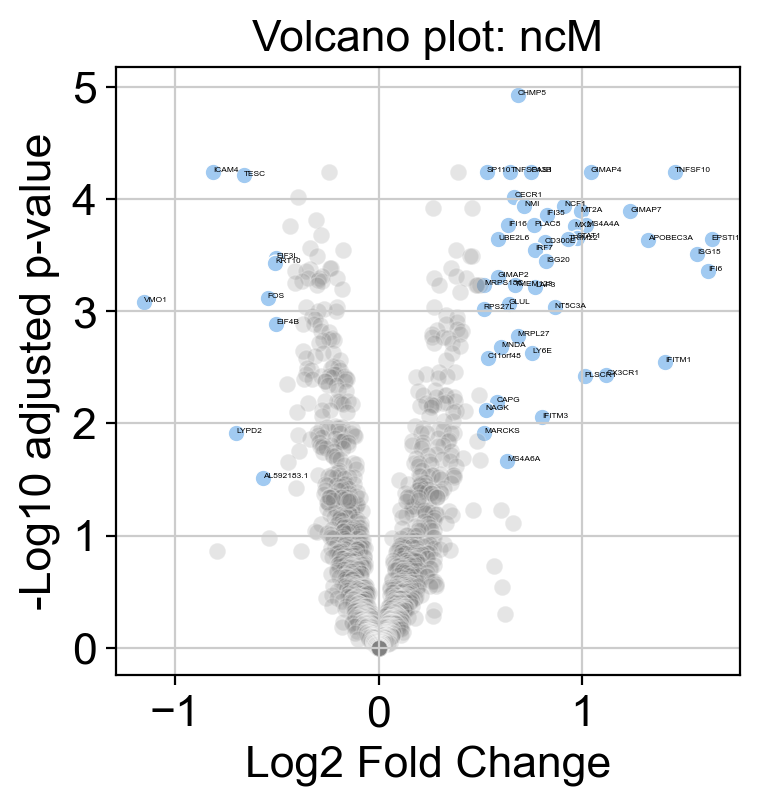

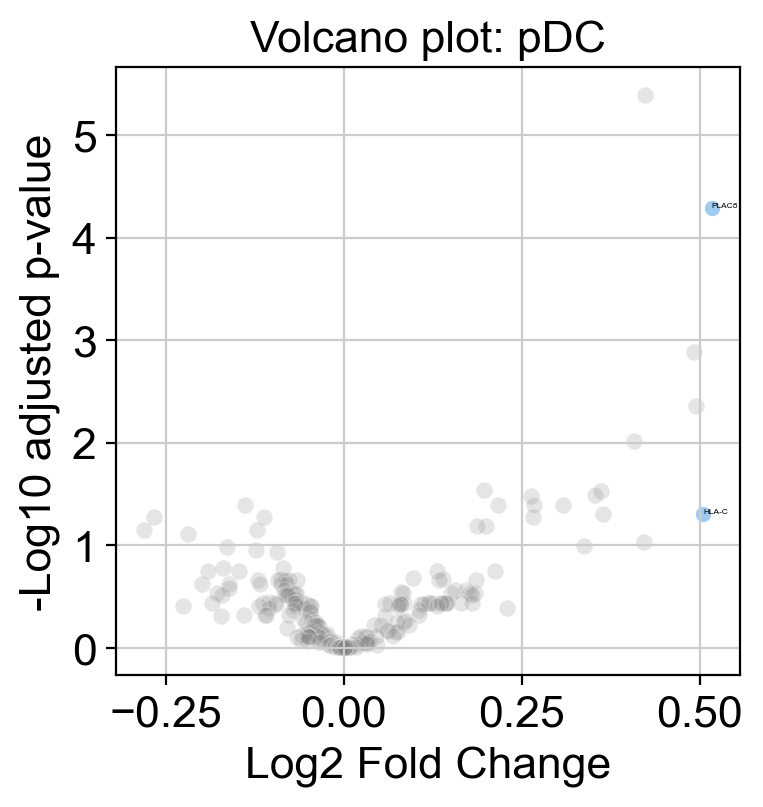

In [10]:
URG_Euro = {}; DRG_Euro = {};
cg_groups = np.unique(cdata.obs['cg_cov'].tolist())
for ii in range(len(cg_groups)):
    plt.figure()
    tmp = pd.read_csv('deseq2_l3_voom/{0}_cg.{1}.1.edger.txt'.format(cg_groups[ii], 'European'), index_col=0)
    URG_Euro[cg_groups[ii]], DRG_Euro[cg_groups[ii]] = make_volcanoplot(tmp, cg_groups[ii], save=True,
                                savetitle="{} Volcano Plot European".format(cg_groups[ii]))
    
    

## Cell type specific gene signatures

In [11]:
ct_groups = np.unique(cdata.obs['cg_cov'].tolist())
DE_European = {}; DE_Asian = {}; ct_specific_signatures = {}
for ii in range(len(ct_groups)):
    DE_European[ct_groups[ii]] = list(URG_Euro[ct_groups[ii]])+list(DRG_Euro[ct_groups[ii]])
    DE_Asian[ct_groups[ii]]  = list(URG_Asian[ct_groups[ii]])+list(DRG_Asian[ct_groups[ii]])
    ct_specific_signatures[ct_groups[ii]] = np.unique(DE_European[ct_groups[ii]] + DE_Asian[ct_groups[ii]])

In [12]:
DEGenes = [];
for ct in range(len(MasterORDER)):
    DEGenes.extend(ct_specific_signatures[MasterORDER[ct]])
DEGenes = np.unique(DEGenes)
print('Number of unique DE genes found in >=1 cell type: {}'.format(len(DEGenes)))

Number of unique DE genes found in >=1 cell type: 302


In [13]:
Asian_Groups = ['{}-Asian'.format(cg) for cg in cg_groups]
Euro_Groups = ['{}-European'.format(cg) for cg in cg_groups]
DEFrame = pd.DataFrame(index=DEGenes, columns=np.sort(Asian_Groups+Euro_Groups))

cg_groups = np.unique(cdata.obs['cg_cov'].tolist())
for ii in range(len(cg_groups)):
    tmpA = pd.read_csv('deseq2_l3_voom/{0}_cg.{1}.1.edger.txt'.format(cg_groups[ii], 'Asian'), index_col=0)
    tmpE = pd.read_csv('deseq2_l3_voom/{0}_cg.{1}.1.edger.txt'.format(cg_groups[ii], 'European'), index_col=0)
    for gene in DEGenes:
        if len(tmpA[tmpA.index.isin([gene])])>0:
            if tmpA[tmpA.index.isin([gene])]['adj.pvalue'][0]<0.05:
                DEFrame.loc[gene, '{}-Asian'.format(cg_groups[ii])] = tmpA[tmpA.index.isin([gene])]['log2FoldChange'][0]
        if len(tmpE[tmpE.index.isin([gene])])>0:
            if tmpE[tmpE.index.isin([gene])]['adj.pvalue'][0]<0.05:
                DEFrame.loc[gene, '{}-European'.format(cg_groups[ii])] = tmpE[tmpE.index.isin([gene])]['log2FoldChange'][0]
    
Module_Dataframes = {}
DEFrame['Module'] = np.repeat(' ', len(DEFrame))
modules = ['Up-Pan', 'Down-Pan', 'Up-Monocyte', 'Up-T', 'Down-Monocyte', 'Up-B']
for mod in modules:
    Module_Dataframes[mod]  = pd.read_csv('Module_Dataframe_{}.csv'.format(mod), index_col=0)
    DEFrame.loc[DEFrame.index.isin(Module_Dataframes[mod].columns.tolist()), 'Module'] = mod
DEFrame.to_csv('Table3.csv')

# Module Heatmap (including cluster 1)

#### Cluster 1 genes did not appear to track well with certain cell types so these genes were not added to modules. 'AC132872.2', 'CACNA2D4', 'CHD1', 'CYP1B1', 'HCAR3', 'NR1D2', 'PIK3R1', 'TCEAL4'

In [16]:
dz_colors = pd.read_csv('Status_colors.csv', index_col=0)['0'].tolist()
pop_colors = pd.read_csv('pop_colors.csv', index_col=0)['0'].tolist()
celltype_col_colors = pd.read_csv('CellType_colors.csv', index_col=0)['0'].tolist()

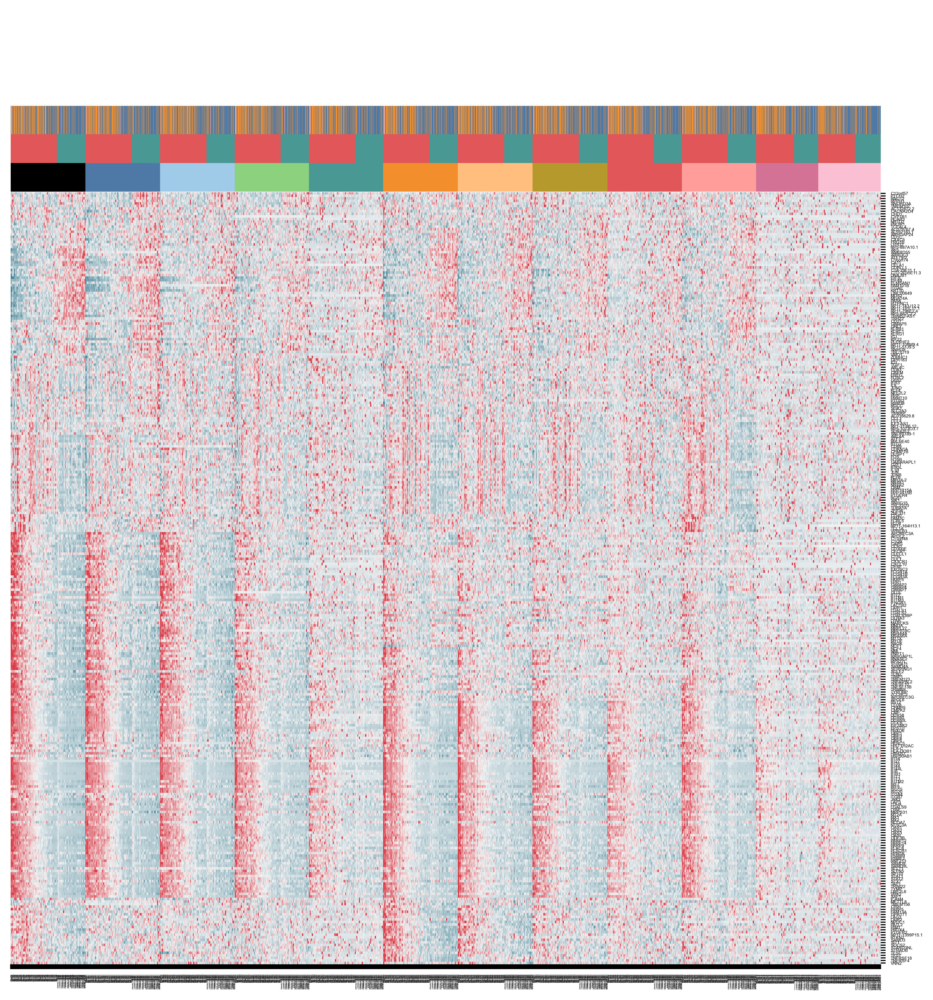

In [17]:
Fig3A = pd.read_csv('Fig3A_dataframe_notordered.csv', index_col=0)
sc.settings.set_figure_params(dpi=200, dpi_save=800, format='png', frameon=False, transparent=True, fontsize=3)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
cg = sns.clustermap(Fig3A,  method ='complete', cmap=cmap,
                    center=0, yticklabels=1, xticklabels=1, z_score=0,
                    row_cluster=False, col_cluster=False, vmin=-3, vmax=3, cbar_pos=None,
                    col_colors=[pop_colors, dz_colors, celltype_col_colors],
                    dendrogram_ratio=0.1)
plt.setp(cg.ax_heatmap.xaxis.get_majorticklabels(), rotation=90, size=1)
cg.ax_row_dendrogram.set_visible(False)



# Module Heatmap (Ordered)

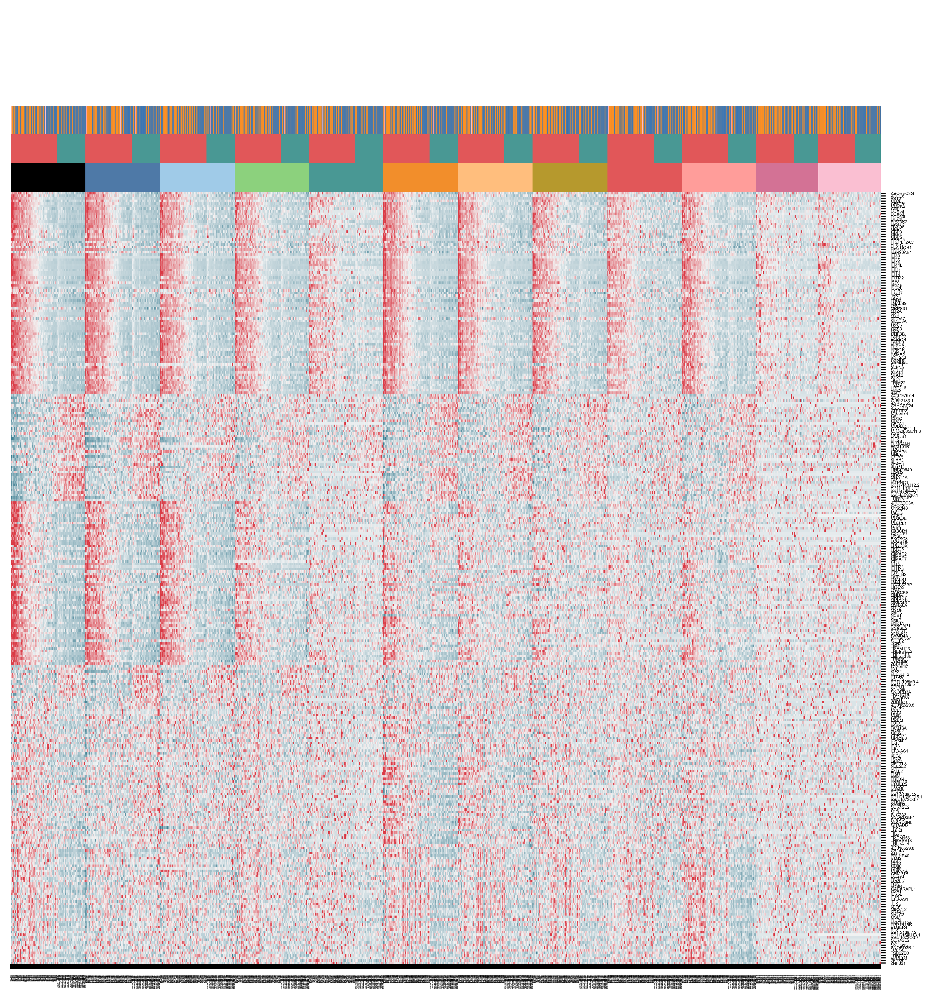

In [18]:
sc.settings.set_figure_params(dpi=200, dpi_save=800, format='png', frameon=False, transparent=True, fontsize=3)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
Fig3A = pd.read_csv('Fig3A_dataframe.csv', index_col=0)
CG = sns.clustermap(Fig3A,  method ='complete', cmap=cmap,
                    center=0, yticklabels=1, xticklabels=1, z_score=0,
                    row_cluster=False, col_cluster=False, vmin=-3, vmax=3, cbar_pos=None,
                    col_colors=[pop_colors, dz_colors, celltype_col_colors],
                    dendrogram_ratio=0.1, colors_ratio=(0.005, 0.03))
plt.setp(CG.ax_heatmap.xaxis.get_majorticklabels(), rotation=90, size=1)
CG.ax_row_dendrogram.set_visible(False)


# Load Module Signatures

### Use only processing batch 4 (age and ancestry balanced) to be conservative

In [19]:
adata = sc.read(savepath, cache=True)
adata = adata[adata.obs['Processing_Cohort']=='4.0'] # Processing Batch 4 only
print('Processed dataset: {}'.format(adata))
X = adata.raw.X
obs = pd.DataFrame()
obs['SLE_status'] = adata.obs['SLE_status'].tolist()
obs['ind_cov'] = adata.obs['ind_cov'].tolist()
obs['batch_cov'] = adata.obs['batch_cov'].tolist()
obs['pop_cov'] = adata.obs['pop_cov'].tolist()
obs['cg_cov'] = adata.obs['cg_cov'].tolist()
obs['ct_cov'] = adata.obs['ct_cov'].tolist()
var_names = adata.raw.var_names.tolist()
var = pd.DataFrame(index=var_names)
cdata = ad.AnnData(X, obs=obs, var=var, dtype='int32')
cdata.raw = cdata
# Remove these people from frame if present as they are also in flare hold out (replicates)
cdata = cdata[~cdata.obs['ind_cov'].isin(['1772_1772', '1130_1130', '1763_1763'])]
print('Dataset: {}'.format(cdata))
del adata

Processed dataset: View of AnnData object with n_obs × n_vars = 375261 × 1999
    obs: 'batch_cov', 'ind_cov', 'Processing_Cohort', 'louvain', 'cg_cov', 'ct_cov', 'L3', 'ind_cov_batch_cov', 'Age', 'Sex', 'pop_cov', 'Status', 'SLE_status'
    var: 'gene_ids'
    uns: 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
Dataset: View of AnnData object with n_obs × n_vars = 368993 × 32738
    obs: 'SLE_status', 'ind_cov', 'batch_cov', 'pop_cov', 'cg_cov', 'ct_cov'


In [21]:
modules = ['Up-Pan', 'Down-Pan', 'Up-Monocyte', 'Up-T', 'Down-Monocyte', 'Up-B']

for mod in modules:
    Module_Dataframes[mod]  = pd.read_csv('Module_Dataframe_{}.csv'.format(mod), index_col=0)


In [22]:
# Use this function to make Module Dataframes from certain cell types:
# e.g. Module Up-Pan composed of ['T4', 'cM', 'B', 'T8', 'NK', 'ncM', 'Prolif', 'cDC', 'pDC', 'PB', 'Progen']
'''
def get_module_pseudobulk(module_genes, cdata, cg_covs_to_include):
    Module_Dataframes = {}
    modL = list(module_genes.keys())
    for ii in range(len(modL)):
        print('Module {}'.format(modL[ii]))
        print('Composed of {}'.format(cg_covs_to_include[modL[ii]]))
        fdata = cdata[cdata.obs['cg_cov'].isin(cg_covs_to_include[modL[ii]])]
        pseudobulk = get_pseudobulk(fdata, save=False, load=False, savetitle="")
        Module_Genes = module_genes[modL[ii]]
        pseudobulk = pseudobulk[pseudobulk.index.isin(Module_Genes)]
        Module_Dataframes[modL[ii]] = pseudobulk.transpose()
    return Module_Dataframes
'''

'\ndef get_module_pseudobulk(module_genes, cdata, cg_covs_to_include):\n    Module_Dataframes = {}\n    modL = list(module_genes.keys())\n    for ii in range(len(modL)):\n        print(\'Module {}\'.format(modL[ii]))\n        print(\'Composed of {}\'.format(cg_covs_to_include[modL[ii]]))\n        fdata = cdata[cdata.obs[\'cg_cov\'].isin(cg_covs_to_include[modL[ii]])]\n        pseudobulk = get_pseudobulk(fdata, save=False, load=False, savetitle="")\n        Module_Genes = module_genes[modL[ii]]\n        pseudobulk = pseudobulk[pseudobulk.index.isin(Module_Genes)]\n        Module_Dataframes[modL[ii]] = pseudobulk.transpose()\n    return Module_Dataframes\n'

## Compare Module expression between Asian and Europeans

In [23]:
def get_pseudobulk_score(Frame, cdata, score_genes, score_name):
    Asian_people = cdata.obs['ind_cov'][cdata.obs['pop_cov']=='Asian'].unique().tolist()
    Euro_people = cdata.obs['ind_cov'][cdata.obs['pop_cov']=='European'].unique().tolist()
    SLE_people = cdata.obs['ind_cov'][cdata.obs['SLE_status']=='SLE'].unique().tolist()
    Healthy_people = cdata.obs['ind_cov'][cdata.obs['SLE_status']=='Healthy'].unique().tolist()
    Frame = pd.DataFrame(Frame.transpose()[Frame.columns.isin(score_genes)].mean(axis=0), columns=[score_name])
    Frame['eth'] = np.repeat(np.nan, len(Frame))
    Frame['dz'] = np.repeat(np.nan, len(Frame))
    Frame['eth'][Frame.index.isin(Asian_people)] = 'Asian'
    Frame['eth'][Frame.index.isin(Euro_people)] = 'European'
    Frame['dz'][Frame.index.isin(SLE_people)] = 'SLE'
    Frame['dz'][Frame.index.isin(Healthy_people)] = 'Healthy'
    Frame['eth_dz'] = pd.Categorical(Frame.apply(lambda row: row['eth'] + row['dz'], axis=1), ordered=True)
    return Frame

def violin_score(Frame, cdata, score_genes, score_name):
    plt.figure()
    Frame = get_pseudobulk_score(Frame, cdata, score_genes=score_genes, score_name=score_name)
    perc_plot = sns.violinplot(x='eth_dz', y=score_name, order=['EuropeanHealthy', 'EuropeanSLE', 'AsianHealthy',
                                                                    'AsianSLE'], data=Frame, cut=0, dodge=False,
                        palette=[colorrs[3], colorrs[7], colorrs[3], colorrs[7]], linewidth=.5)
    perc_plot.set_xticklabels(perc_plot.get_xticklabels(), size=18)

    sns.swarmplot(x="eth_dz", y=score_name, data=Frame,
                  order=['EuropeanHealthy', 'EuropeanSLE', 'AsianHealthy', 'AsianSLE'], 
                  color='k', size=3, linewidth=0.5)

    perc_plot.axes.get_yaxis().label.set_visible(False)
    perc_plot.axes.get_xaxis().label.set_visible(False)
    perc_plot.axes.tick_params(axis="y", direction='in', length=3, width=1, pad=2)
    perc_plot.axes.tick_params(axis="x", direction='out', length=3, width=1, pad=1)
    labels = [item.get_text() for item in perc_plot.get_xticklabels()]
    empty_string_labels = ['']*len(labels)
    perc_plot.set_xticklabels(empty_string_labels)
    perc_plot.set_xticklabels(["ECTL", "ESLE", "ACTL", "ASLE"])
    plt.title('{}'.format(score_name))
    plt.savefig(figdir+"/violin.{}.png".format(score_name))
    
    def get_proportion_stats(ind_perc, group1, group2, covar):
        print('{0} versus {1}'.format(group1, group2))
        all_out = pd.DataFrame();
        ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
        Effect = {}
        ct_perc = ind_perc0[score_name]
        disease = ind_perc0[covar]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.OLS(ct_perc.astype(float), disease.astype(float))
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect = effect
        all_out = all_out.append(({"Score":score_name, "Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
        def highlight_max(p):
            sig = p < (0.05/len(p))
            return ['background-color: yellow' if v else '' for v in sig]
        all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
        display(all_out)

    get_proportion_stats(Frame, group1=['EuropeanHealthy'], group2=['EuropeanSLE'], covar='eth_dz')
    get_proportion_stats(Frame, group1=['AsianHealthy'], group2=['AsianSLE'], covar='eth_dz')
    get_proportion_stats(Frame, group1=['EuropeanSLE'], group2=['AsianSLE'], covar='eth_dz')



Up-Pan
['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Pval,Score
0,5.355877442069714e-05,0.000053,Up-Pan


['AsianHealthy'] versus ['AsianSLE']


,Beta,Pval,Score
0,5.727376325419149e-05,0.000044,Up-Pan


['EuropeanSLE'] versus ['AsianSLE']


,Beta,Pval,Score
0,4.665509562663626e-06,0.768693,Up-Pan


Down-Pan
['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Pval,Score
0,-1.6694888851912076e-05,0.000632,Down-Pan


['AsianHealthy'] versus ['AsianSLE']


,Beta,Pval,Score
0,-1.0592852626789192e-05,0.005198,Down-Pan


['EuropeanSLE'] versus ['AsianSLE']


,Beta,Pval,Score
0,-1.916962797972181e-06,0.598258,Down-Pan


Up-Monocyte
['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Pval,Score
0,5.723521108744953e-05,0.000013,Up-Monocyte


['AsianHealthy'] versus ['AsianSLE']


,Beta,Pval,Score
0,6.528690446898212e-05,0.000004,Up-Monocyte


['EuropeanSLE'] versus ['AsianSLE']


,Beta,Pval,Score
0,1.3276042056326513e-05,0.375050,Up-Monocyte


Up-T
['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Pval,Score
0,3.895032039005876e-06,0.017695,Up-T


['AsianHealthy'] versus ['AsianSLE']


,Beta,Pval,Score
0,2.7473843388441385e-06,0.094072,Up-T


['EuropeanSLE'] versus ['AsianSLE']


,Beta,Pval,Score
0,6.043663598573514e-07,0.738091,Up-T


Down-Monocyte
['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Pval,Score
0,-7.68202067442563e-06,0.023086,Down-Monocyte


['AsianHealthy'] versus ['AsianSLE']


,Beta,Pval,Score
0,-1.639269389661166e-05,0.000009,Down-Monocyte


['EuropeanSLE'] versus ['AsianSLE']


,Beta,Pval,Score
0,-2.9914498832689495e-08,0.991164,Down-Monocyte


Up-B
['EuropeanHealthy'] versus ['EuropeanSLE']


,Beta,Pval,Score
0,1.2394277842390571e-05,0.263886,Up-B


['AsianHealthy'] versus ['AsianSLE']


,Beta,Pval,Score
0,-8.496170165112423e-06,0.419115,Up-B


['EuropeanSLE'] versus ['AsianSLE']


,Beta,Pval,Score
0,8.620601326254563e-06,0.431692,Up-B


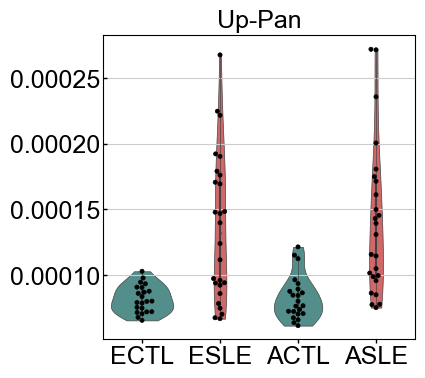

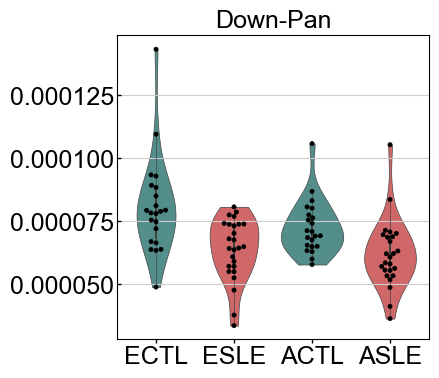

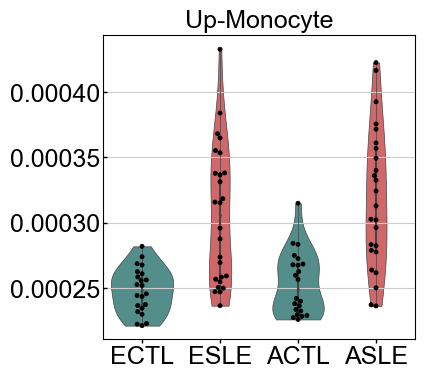

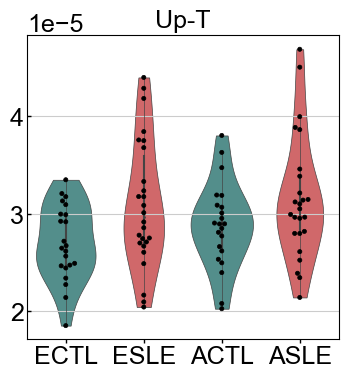

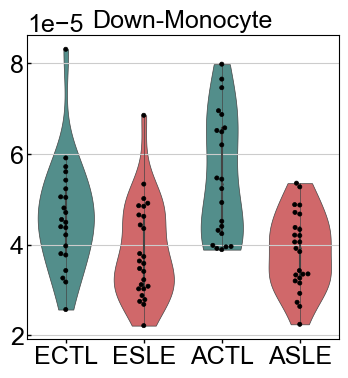

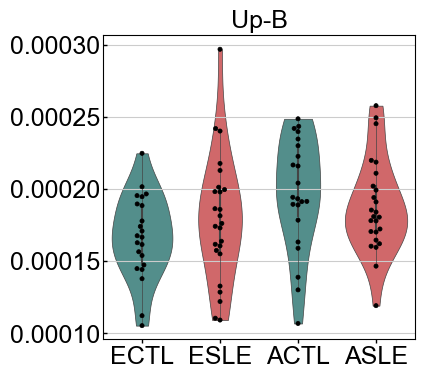

In [24]:
sc.settings.set_figure_params(dpi=50, dpi_save=150, format='pdf', frameon=False, transparent=True, fontsize=18)
for mod in list(Module_Dataframes.keys()):
    print(mod)
    violin_score(Module_Dataframes[mod], cdata, Module_Dataframes[mod].columns.tolist(), score_name=mod)


# GSEA

In [25]:
first=True
sc.settings.set_figure_params(dpi=75, dpi_save=200, format='png', frameon=False, transparent=True, fontsize=16)
sns.set_style("whitegrid", {'axes.grid' : True})
for mod in modules:
    file = pd.read_excel('~/Documents/Lupus_study.nosync/ToppFunresults/'+mod+'.xlsx')
    file = file[~file['Category'].isin(['Domain', 'Coexpression Atlas','Mouse Phenotype',
                                        'ToppCell Atlas','Drug', 'Cytoband', 'Gene Family',
                                        'Coexpression', 'MicroRNA', 'Computational', 'Pubmed', 
                                        'Transcription Factor Binding Site', 'Interaction','Human Phenotype',
                                        'GO: Cellular Component', 'Disease'])]
    file = file[file['q-value FDR B&H']<0.05]
    file['-log q'] = np.log10(file['q-value FDR B&H'])*-1
    file = file.sort_values('-log q')
    if first==True:
        file['Module'] = np.repeat(mod, len(file))
        file0 = file
        first=False
    else:
        file['Module'] = np.repeat(mod, len(file))
        file0 = pd.concat([file0, file], axis=0)
file0 = file0.sort_values('-log q', ascending=False).reset_index()


MODULES_Names = np.asarray(file0['Module'].unique().tolist())
module_index = []
for ii in range(len(file0['Module'])):
    module_index.append(np.ravel(np.argwhere(MODULES_Names==file0['Module'][ii])))
    
module_index = np.ravel(module_index)
file0['Module_Dummy'] = module_index
file0['# of Genes'] = [len(file0['Hit in Query List'][ii].split(',')) for ii in range(len(file0['Hit in Query List']))]
file0['Y_pos'] = len(file0)-np.asarray(file0.index.tolist())

GO2keep = []
for mod in MODULES_Names:
    GO2keep.extend(file0[file0['Module']==mod].sort_values('-log q', ascending=False)[:20]['Name'].tolist())
file0 = file0[file0['Name'].isin(GO2keep)]

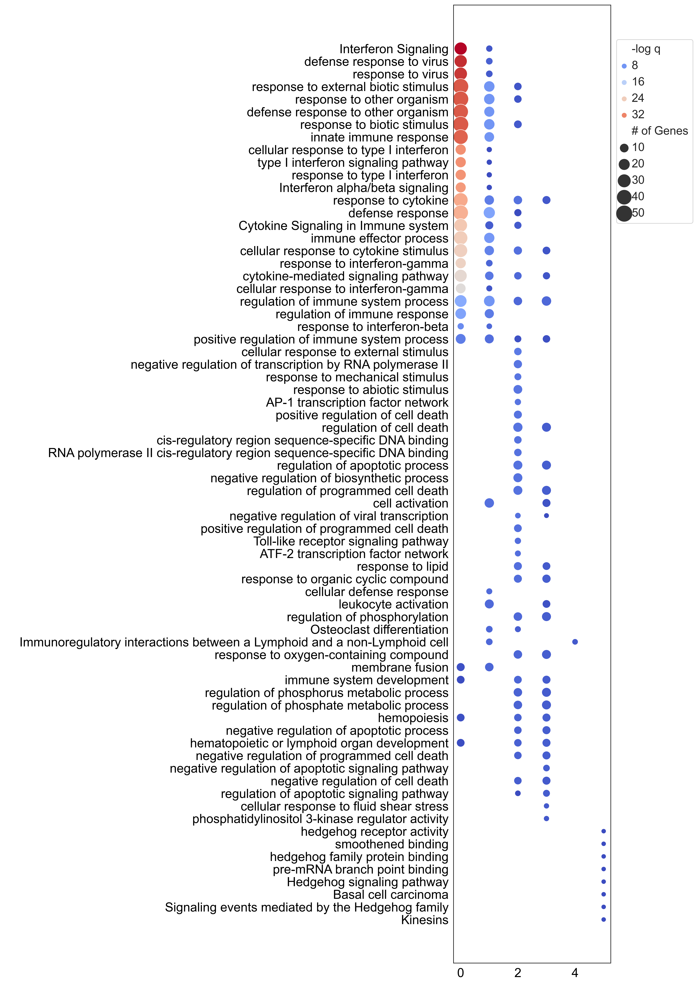

In [26]:
sc.settings.set_figure_params(dpi=200, dpi_save=800, format='png', frameon=False, transparent=True, fontsize=18)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
ig, ax = plt.subplots(figsize = (4, 25))
plt.grid(False, which = 'both', axis = 'both')
plt.rc('axes', axisbelow=True)

sns.scatterplot(x='Module_Dummy', y='Name', data=file0, size='# of Genes', sizes=(50, 500),
                hue='-log q', palette='coolwarm')
plt.legend(bbox_to_anchor=(1.0, 0.97), loc='upper left')
plt.ylabel(" ")
plt.xlabel(" ")
plt.show()

# Molecular Groups

In [28]:
cdata.obs['pop_cov_SLE_status'] = pd.Categorical(cdata.obs.apply(lambda row: row['pop_cov'] + row['SLE_status'], axis=1), ordered=True)


Trying to set attribute `.obs` of view, copying.


## Combine module pseudobulk frames and compute PCA and Kmeans

In [29]:
first=False
for key in modules:
    if first == False:
        combined = Module_Dataframes[key]
        first = True
    else:
        combined = pd.concat([combined, Module_Dataframes[key]], axis=1)
X = combined.dropna(axis=0)
# Use this code to generate the PCA and Kmeans groups
'''
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
pca = PCA(n_components=5, random_state=0)
X_pca = pca.fit(X).transform(X)
X_pca = pd.DataFrame(X_pca, index=X.index.tolist())
X_pca = X_pca.rename({0:'PCA 0', 1:'PCA 1',2:'PCA 2',3:'PCA 3', 4:'PCA 4'},axis=1)
Km = KMeans(n_clusters=2, random_state=0, n_init=1000, max_iter=1000).fit(X_pca)
X_pca['Kmeans_label'] = Km.predict(X_pca)
cls = [cdata.obs['SLE_status'][cdata.obs['ind_cov']==p].unique()[0] for p in X_pca.index.tolist()]
X_pca['Health Status'] = cls
cls = [cdata.obs['pop_cov'][cdata.obs['ind_cov']==p].unique()[0] for p in X_pca.index.tolist()]
X_pca['pop_cov'] = cls
'''

"\nfrom sklearn.decomposition import PCA\nfrom sklearn.cluster import KMeans\npca = PCA(n_components=5, random_state=0)\nX_pca = pca.fit(X).transform(X)\nX_pca = pd.DataFrame(X_pca, index=X.index.tolist())\nX_pca = X_pca.rename({0:'PCA 0', 1:'PCA 1',2:'PCA 2',3:'PCA 3', 4:'PCA 4'},axis=1)\nKm = KMeans(n_clusters=2, random_state=0, n_init=1000, max_iter=1000).fit(X_pca)\nX_pca['Kmeans_label'] = Km.predict(X_pca)\ncls = [cdata.obs['SLE_status'][cdata.obs['ind_cov']==p].unique()[0] for p in X_pca.index.tolist()]\nX_pca['Health Status'] = cls\ncls = [cdata.obs['pop_cov'][cdata.obs['ind_cov']==p].unique()[0] for p in X_pca.index.tolist()]\nX_pca['pop_cov'] = cls\n"

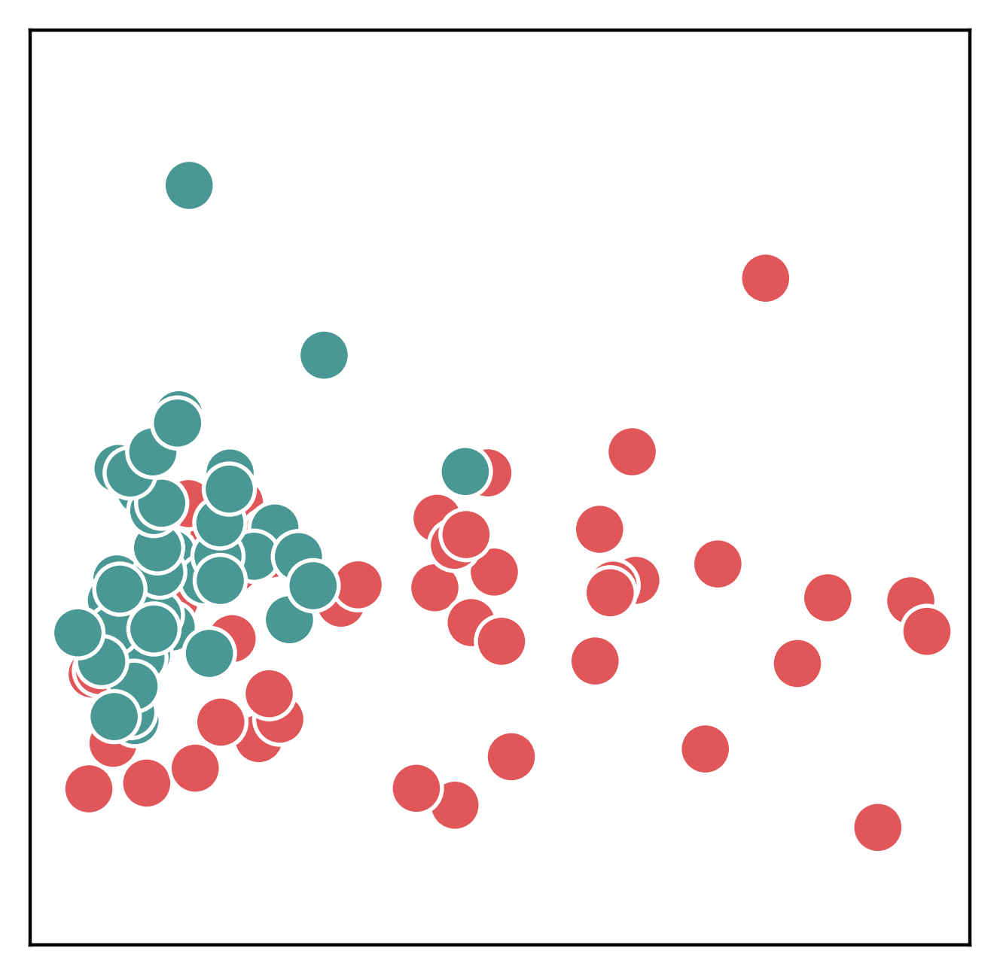

In [30]:
X_pca_projection_train  = pd.read_csv('MolecularGroupPCA_Train.csv', index_col=0)
plt.figure()
ax = sns.scatterplot(x='PCA 0', y='PCA 1', hue='Health Status',
                     data = X_pca_projection_train, s=150, palette=[colorrs[7], colorrs[3]])
ax.set(xlim=(-0.0017, 0.0042), ylim=(-0.0025, 0.004))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.xlabel("")
plt.ylabel("")
labels = [item.get_text() for item in ax.get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax.set_xticklabels(empty_string_labels)
ax.set_yticklabels(empty_string_labels)
ax.get_legend().remove()


## Heatmap of top 25 correlated genes to PC 1

Text(843.7083333333334, 0.5, '')

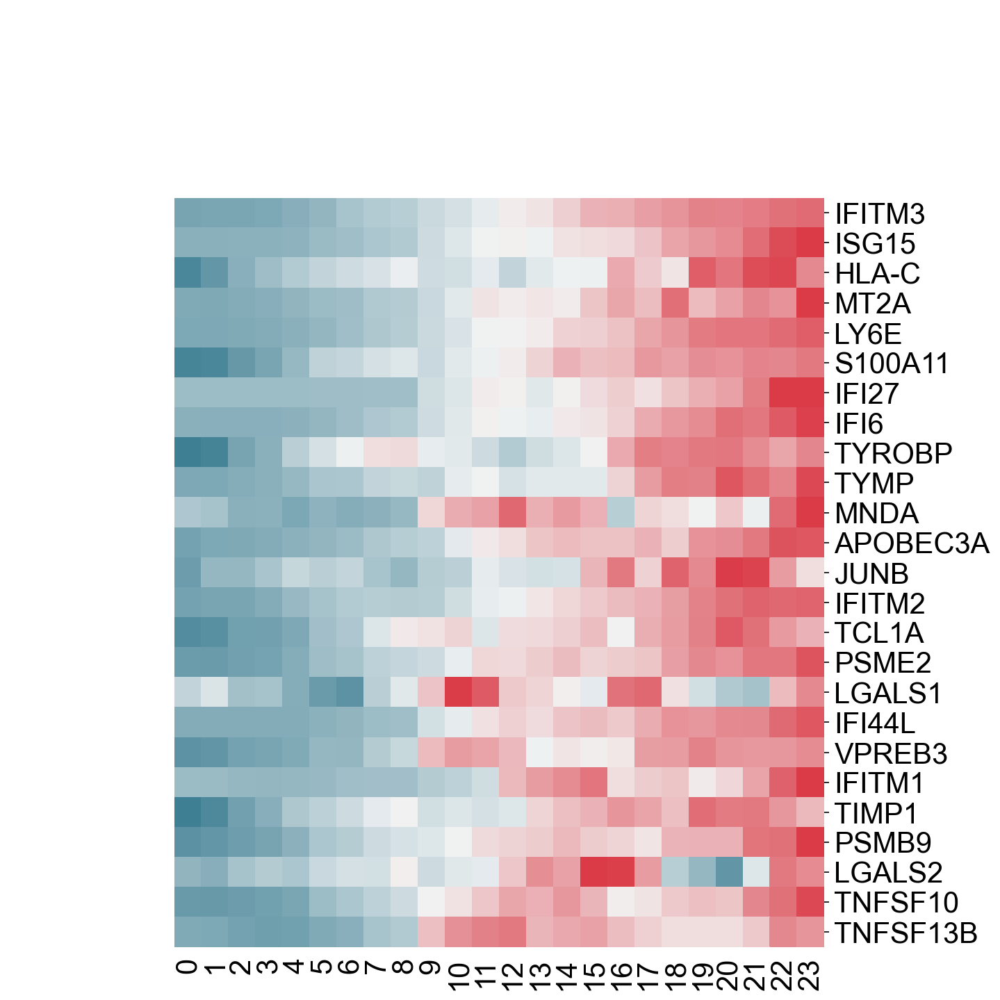

In [31]:
sc.settings.set_figure_params(dpi=75, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=20)
g = sns.clustermap(pd.read_csv('Top25CorrelatedGenes2PC1.csv', index_col=0),method ='complete', cmap=cmap,
               center=0, yticklabels=1, xticklabels=1, z_score=0,
               row_cluster=False, col_cluster=False,vmin=-2, vmax=2, cbar_pos=None)
ax = g.ax_heatmap
ax.set_ylabel('')

### Kmean clustering

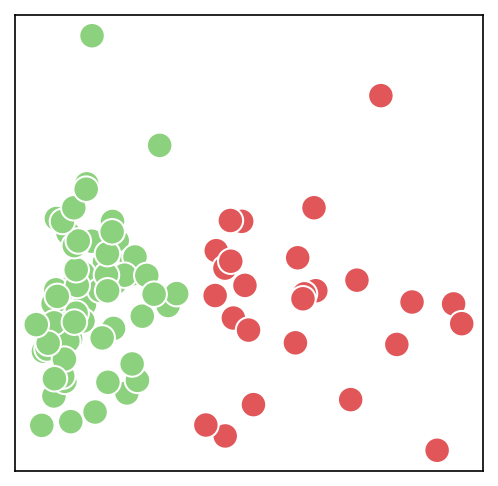

In [32]:
plt.figure()
ax = sns.scatterplot(x='PCA 0', y='PCA 1', hue='Kmeans_label', data = X_pca_projection_train, s=150,
                     palette=[colorrs[2], colorrs[7]])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.xlabel("")
plt.ylabel('')
labels = [item.get_text() for item in ax.get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax.set_xticklabels(empty_string_labels)
ax.set_yticklabels(empty_string_labels)
ax.get_legend().remove()

In [33]:
X_pca_projection_train['SLE_cat'] = np.repeat('error', len(X_pca_projection_train))
X_pca_projection_train['SLE_cat'][(X_pca_projection_train['Kmeans_label'].isin([0])) & (X_pca_projection_train['Health Status']=='SLE')] = 'Low'
X_pca_projection_train['SLE_cat'][(X_pca_projection_train['Kmeans_label'].isin([1])) & (X_pca_projection_train['Health Status']=='SLE')] = 'High'
X_pca_projection_train['SLE_cat'][(X_pca_projection_train['Health Status']=='Healthy')] = 'Healthy'


In [34]:
clinical_data = pd.read_excel('Clinical_Data.V2_updated.xlsx')
clinical_data = clinical_data.set_index('genotypeid')
X_pca_projection_train['SLEDAI'] = clinical_data['sledaiscore']

RanksumsResult(statistic=-2.9686360504447156, pvalue=0.0029912465204538306)


Text(0.5, 1.0, 'Mean SLEDAI \n Low: 1.8, High: 4.0 \n')

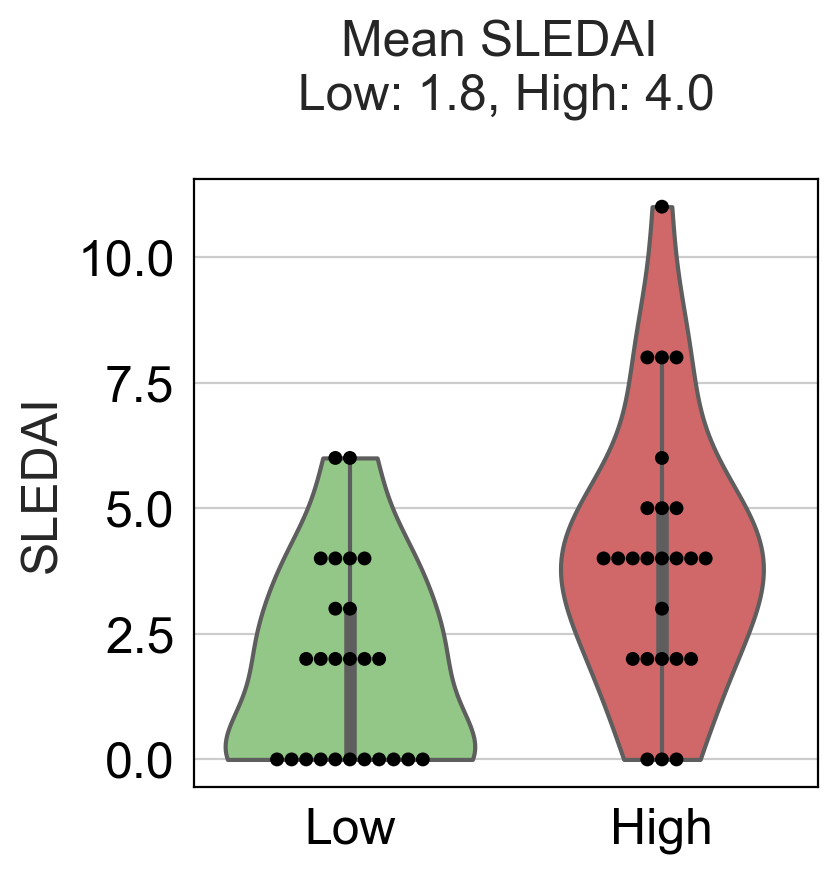

In [35]:
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='png', frameon=False, transparent=True, fontsize=18)
sns.violinplot(x='SLE_cat', y='SLEDAI', data=X_pca_projection_train.dropna(axis=0),
               palette=[colorrs[2],colorrs[7]],
               order=['Low', 'High'], cut=0)
sns.swarmplot(x='SLE_cat', y='SLEDAI', data=X_pca_projection_train.dropna(axis=0), color='k', size=5,
              order=['Low', 'High'])
plt.xlabel('')

L = X_pca_projection_train['SLEDAI'][X_pca_projection_train['SLE_cat']=='Low'].dropna().values
H = X_pca_projection_train['SLEDAI'][X_pca_projection_train['SLE_cat']=='High'].dropna().values

print(stats.ranksums(L, H))
L = np.round(np.nanmean(L),1)
H = np.round(np.nanmean(H),1)
plt.title('Mean SLEDAI \n Low: {}, High: {} \n'.format(L,H))

RanksumsResult(statistic=5.811153575870538, pvalue=6.204381255849629e-09)


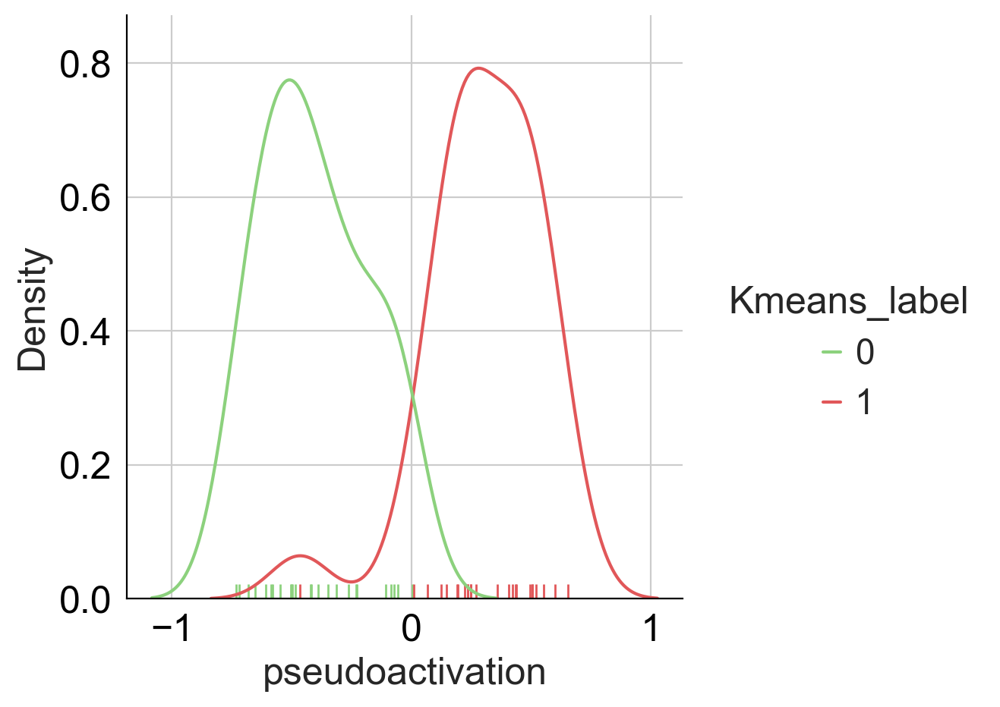

In [36]:
pseudoactivation = pd.read_csv('cM_donor.csv').set_index('ind_cov')
X_pca_projection_train['pseudoactivation'] = pseudoactivation['velo_axis']

High = X_pca_projection_train['pseudoactivation'][(X_pca_projection_train['Kmeans_label']==1) & (X_pca_projection_train['Health Status']=='SLE')]
Low = X_pca_projection_train['pseudoactivation'][(X_pca_projection_train['Kmeans_label'].isin([0])) & (X_pca_projection_train['Health Status']=='SLE')]
print(stats.ranksums(High, Low))

sns.displot(x='pseudoactivation',
            data=X_pca_projection_train[(X_pca_projection_train['Health Status']=='SLE')],
            hue='Kmeans_label', kind='kde', rug=True,
            palette=[colorrs[2], colorrs[7]])
plt.savefig(figdir+"/{}.png".format('PCA_people_pseudoactivation_Dist'), bbox_inches='tight')



# Logistic Regressions (Out of sample prediction)

# Create functions

In [37]:
def logistic_regression(tmp_train, tmp_test, n_boot):
    from sklearn.linear_model import LogisticRegression
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve

    # Dependent variable
    y_train = tmp_train['clinical'].values.ravel()
    # Remove dependent variable from variables
    tmp_train = tmp_train.drop('clinical', axis=1)
    features = np.asarray(tmp_train.columns.tolist())
    # observations x features
    X_train = tmp_train.values
    # Dependent variable
    y_test = tmp_test['clinical'].values.ravel()
    # Remove dependent variable from variables
    tmp_test = tmp_test.drop('clinical', axis=1)
    # observations x features
    X_test = tmp_test.values
    # Variables of interest
    ROC_AUC = {}; FPR = {}; TPR = {};
    for ii in range(n_boot):
        try:
            # Fit Logistic regression
            logreg = LogisticRegression(max_iter=20000, penalty='elasticnet', solver='saga', l1_ratio=0.5)
            logreg.fit(X_train, y_train)
            coefficients = np.ravel(logreg.coef_)
            # Perform prediction
            y_pred = logreg.predict(X_test)
            # ROC curve
            logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
            ROC_AUC[ii] = logit_roc_auc 
            # Collect True and False Positive rates
            fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1], drop_intermediate=False)
            FPR[ii] = fpr
            TPR[ii] = tpr
        except:
            ROC_AUC[ii] = np.nan
            FPR[ii] = np.nan
            TPR[ii] = np.nan
            continue
            
    return ROC_AUC, FPR, TPR, features, coefficients


In [38]:
def plot_ROC(ROC_AUC, FPR, TPR, title):
    sc.settings.set_figure_params(dpi=100, dpi_save=200, format='png', frameon=False, transparent=True, fontsize=16)
    plt.figure()
    FPR = {k: FPR[k] for k in list(FPR.keys()) if not np.any(np.isnan(FPR[k]))}
    FPR = pd.DataFrame.from_dict(FPR, orient='index')
    TPR = {k: TPR[k] for k in list(TPR.keys()) if not np.any(np.isnan(TPR[k]))}
    TPR = pd.DataFrame.from_dict(TPR, orient='index')
    
    FPR_mean = FPR.mean(axis=0).values
    TPR_mean = TPR.mean(axis=0).values
    lower95TPR = TPR_mean-(TPR.std(axis=0).values*1.96)
    upper95TPR = TPR_mean+(TPR.std(axis=0).values*1.96)
    plt.plot(FPR_mean, TPR_mean, color='#4ca3dd', linewidth=4)
    plt.fill_between(FPR_mean, lower95TPR, upper95TPR, color='#4ca3dd', alpha=.2)
    plt.plot([0, 1], [0, 1],'k--')
    plt.xlim([-0.02, 1.0])
    plt.ylim([0.0, 1.02])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('{0} \n Mean ROC AUC: {1} \n'.format(title, round(np.nanmean(list(ROC_AUC.values())),3)))
    plt.savefig(figdir+"/{}_ROC_AUC.png".format(title), bbox_inches='tight')
    plt.show()
    

# Load Test Module Dataframe

In [39]:
Module_Dataframes_test = {}
modules = ['Up-Pan', 'Down-Pan', 'Up-Monocyte', 'Up-T', 'Down-Monocyte', 'Up-B']
for mod in modules:
    Module_Dataframes_test[mod]  = pd.read_csv('Module_Dataframe_test_{}.csv'.format(mod),index_col=0)


In [40]:
def combine_modules(Dataframes, modules):
    first=True
    for key in modules:
        if first == True:
            combined = Dataframes[key]
            first = False
        else:  
            combined = pd.concat([combined, Dataframes[key]], axis=1)
    combined = combined.dropna(axis=0)
    Dataframes['Combined'] = combined
    return Dataframes

Module_Dataframes = combine_modules(Module_Dataframes, modules)
Module_Dataframes_test = combine_modules(Module_Dataframes_test, modules)

Train = Module_Dataframes['Combined'].copy()
Test = Module_Dataframes_test['Combined'].copy()


# Preprocess

In [41]:
sc.settings.set_figure_params(dpi=50, dpi_save=200, format='png', frameon=False, transparent=True, fontsize=16)

### Prior to scaling

Text(0.5, 1.0, 'Test')

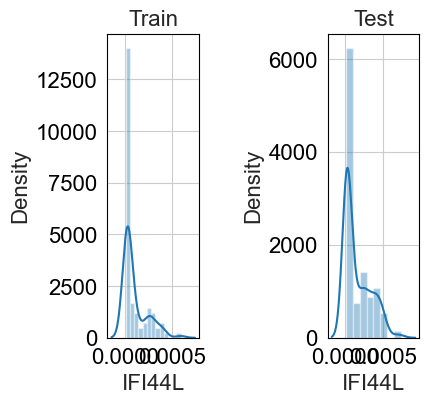

In [42]:
plt.subplot(1,3,1)
sns.distplot(Train['IFI44L'])
plt.title('Train')
plt.subplot(1,3,3)
sns.distplot(Test['IFI44L'])
plt.title('Test')

## Scale data

In [43]:
from sklearn import preprocessing
Train_scaled = pd.DataFrame(preprocessing.MinMaxScaler().fit_transform(Train), index=Train.index.tolist(), columns=Train.columns.tolist())
Test_scaled = pd.DataFrame(preprocessing.MinMaxScaler().fit_transform(Test), index=Test.index.tolist(), columns=Test.columns.tolist())


Text(0.5, 1.0, 'Test')

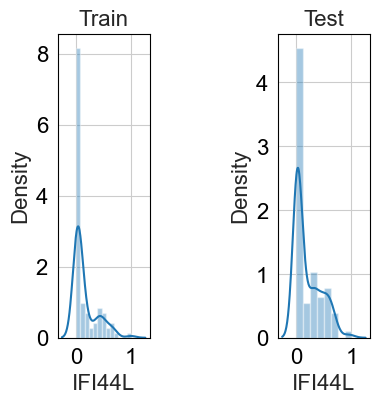

In [44]:
plt.subplot(1,3,1)
sns.distplot(Train_scaled['IFI44L'])
plt.title('Train')
plt.subplot(1,3,3)
sns.distplot(Test_scaled['IFI44L'])
plt.title('Test')

# Predicting Case/Ctrl

### Out of Sample Prediction

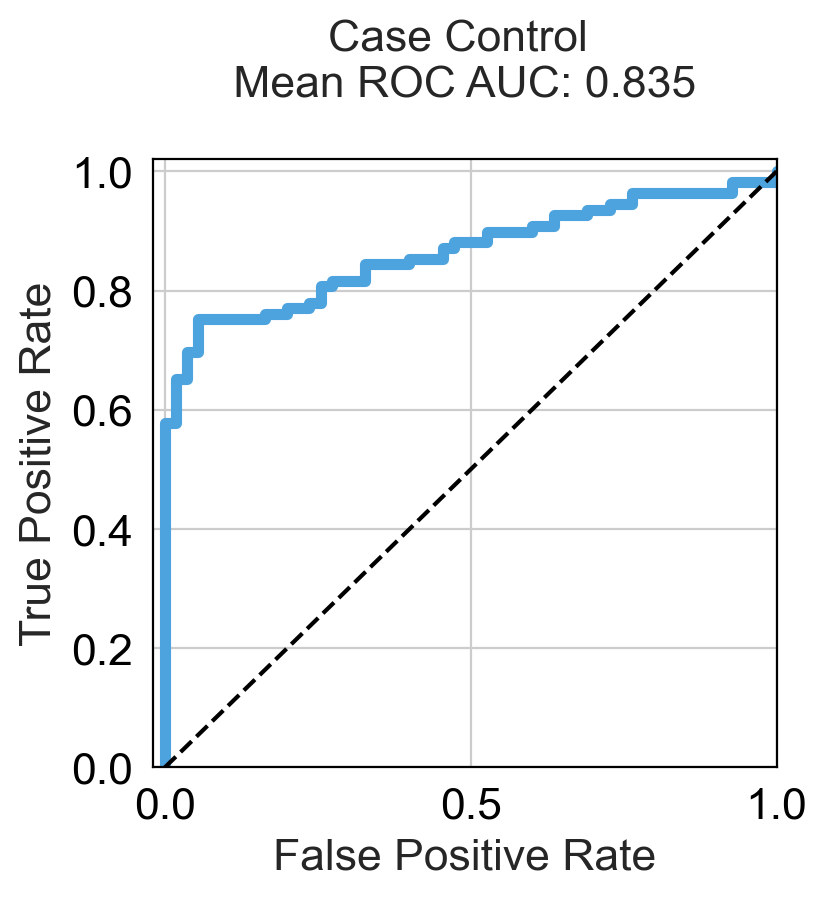

In [45]:
MOD_ROCs = {}; MOD_FPRs = {}; MOD_TPRs = {};
def prepare_data(dataframe, ind_health):
    dataframe = dataframe.copy()
    dataframe['clinical'] = ind_health['Health']
    dataframe['clinical'] = np.asarray(dataframe['clinical']=='SLE')*1
    return dataframe
ind_health = pd.read_csv('Individual_Health_status.csv', index_col=0)
tmp_train = prepare_data(Train_scaled, ind_health)
tmp_test = prepare_data(Test_scaled, ind_health)
ROCs, FPRs, TPRs, features, coefficients = logistic_regression(tmp_train, tmp_test, n_boot=1)
plot_ROC(ROCs, FPRs, TPRs, title='{}'.format('Case Control'))

## Retrieve which cell types these genes are differentially expressed

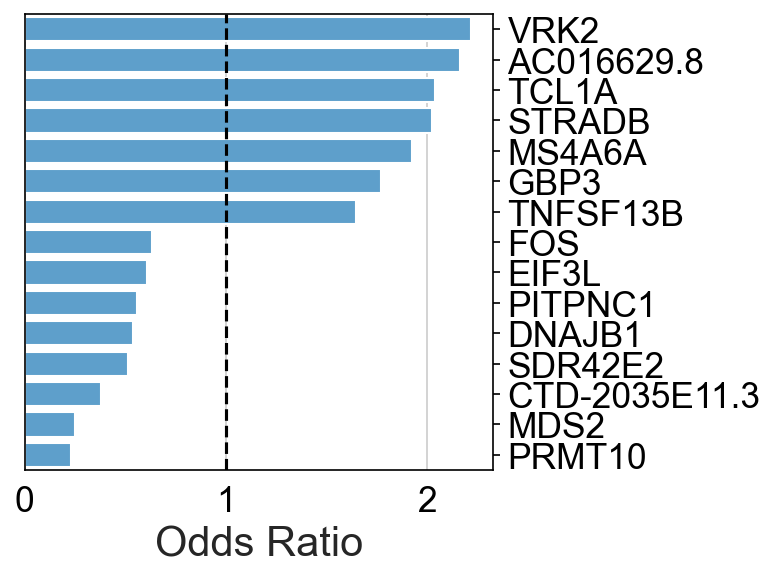

In [46]:
# Plot coefficient barplot
sc.settings.set_figure_params(dpi=75, dpi_save=300, format='png', frameon=False, transparent=False, fontsize=17)
odds = np.exp(coefficients)
coef = pd.DataFrame(coefficients[coefficients!=0], index=features[coefficients!=0], columns=['coefficient'])
coef['Absolute_value'] = np.abs(coefficients[coefficients!=0])
coef = coef.sort_values('Absolute_value', ascending=False)[:15]
coef['Odds Ratio'] = np.exp(coef['coefficient'])
coef['Cell Type'] = np.repeat('error', len(coef))
coef = coef.reset_index()
coef = coef.sort_values('coefficient', ascending=False)
coef["ID"] = coef["index"]
plt.figure(figsize=(4, 4))
ax=sns.barplot(y='ID', x='Odds Ratio', data=coef,color='#4ca3dd')
ax.yaxis.set_ticks_position('right')
plt.axvline(x=1, ls='--', color='k')
plt.ylabel("")
plt.xlabel("Odds Ratio", fontsize=20)
plt.show()

# Correlation to Clinical Outcomes

In [47]:
from sklearn.decomposition import PCA
from sklearn import preprocessing

clin_var = ['sledaiscore', 'acranac', 'acrantidsdna', 'acrantismith','acrleukopenia','sledailowcomp', 'acrmalar',
            'acrrenalc', 'acrneurologc', 'acrarthritisc', 'acrmuculcers', 'acrserositisc',
            'acrthrombocyto', 'acrdiscoid', 'acrphotosensitiv', 'acrapla','acrlymphopenia'
            ]
clinical_data = pd.read_excel('Clinical_Data.V2_updated.xlsx').set_index('genotypeid')
CS = clinical_data[clin_var].dropna(axis=1)
clean_names = {'sledaiscore':'SLEDAI','acranac':'anti-ANA', 'acrantidsdna':'anti-dsDNA','acrantismith':'anti-Smith',
 'acrleukopenia':'Leukopenia','sledailowcomp':'Low Complement','acrmalar':'Malar Rash','acrrenalc':'Renal involvement',
 'acrneurologc':'Neurological involvement','acrarthritisc':'Arthritis','acrmuculcers':'Mucosal Ulcers',
 'acrserositisc':'Serositis', 'acrthrombocyto':'Thrombocytopenia','acrdiscoid':'Discoid Rash',
'acrphotosensitiv':'Photosensitivity', 'acrlymphopenia':'Lymphopenia',
               'acrapla':'anti-Phospholipid'
              }
CS = CS.rename(columns=clean_names)
CS_Master = CS.copy()
mods = list(Module_Dataframes.keys())
Module = pd.DataFrame(index=Module_Dataframes['Combined'].index.tolist())
for mod in mods:
    Module[mod] = pd.DataFrame(Module_Dataframes[mod].mean(axis=1), index=Module_Dataframes[mod].index.tolist())    
Module = pd.DataFrame(preprocessing.MinMaxScaler().fit_transform(Module), index=Module.index.tolist(), columns=Module.columns.tolist())
PC_Comp_clinical = pd.concat([Module, CS], axis=1).dropna(axis=0)
PC_Comp_clinical = PC_Comp_clinical.drop('anti-ANA',axis=1) # Causes a Nan when computing correlation


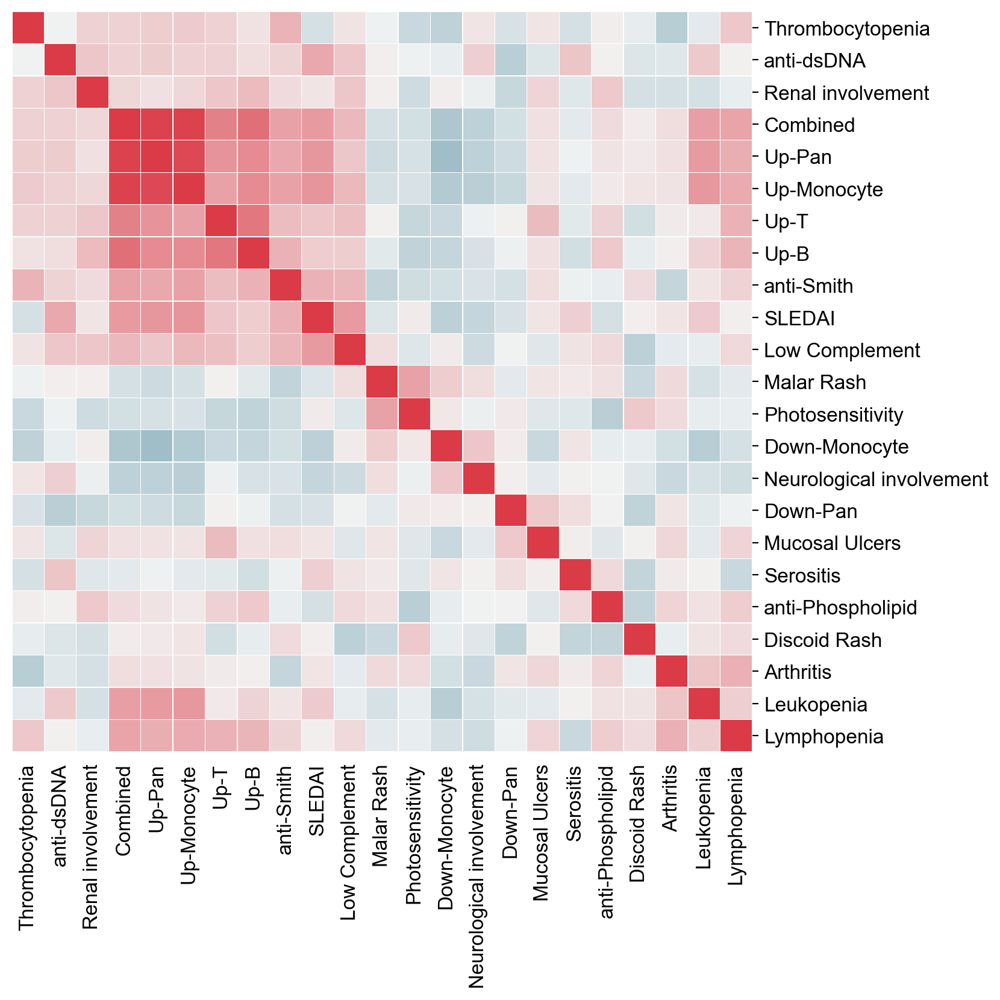

In [48]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=False, fontsize=12)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
corr_matrix = PC_Comp_clinical.corr('spearman')
CG = sns.clustermap(corr_matrix,  method ='complete', cmap=cmap, center=0,
                    yticklabels=1, xticklabels=1, linewidths=.1, cbar_pos=None)
CG.ax_row_dendrogram.set_visible(False)
CG.ax_col_dendrogram.set_visible(False)
plt.savefig(figdir+'/'+'{}.png'.format('Correlation_to_clinical_outcomes'), bbox_inches='tight')


# Predicting Clinical Outcomes

In [49]:
CS_SLEDAI = CS.drop('SLEDAI', axis=1)
CS_SLEDAI = CS_SLEDAI.reindex(columns=['anti-dsDNA', 'Malar Rash', 'Renal involvement','Photosensitivity',
                                       'Mucosal Ulcers','Discoid Rash','Leukopenia', 'anti-Smith', 'Low Complement',
                                       'Serositis', 'Lymphopenia','anti-Phospholipid', 'anti-ANA',
                                       'Neurological involvement','Arthritis','Thrombocytopenia',
                                    ])
# Split Test and Train groups
Train_set_people = Module_Dataframes['Up-Pan'].index.tolist()
CS_SLEDAI_test = CS_SLEDAI.loc[~CS_SLEDAI.index.isin(Train_set_people)] # Remove train set people to make test set
CS_SLEDAI_train = CS_SLEDAI.loc[CS_SLEDAI.index.isin(Train_set_people)] # Keep only train people

tmp2 = pd.melt(CS_SLEDAI_test, var_name='Clinical_Feature', ignore_index=False)


# Compare Test Set

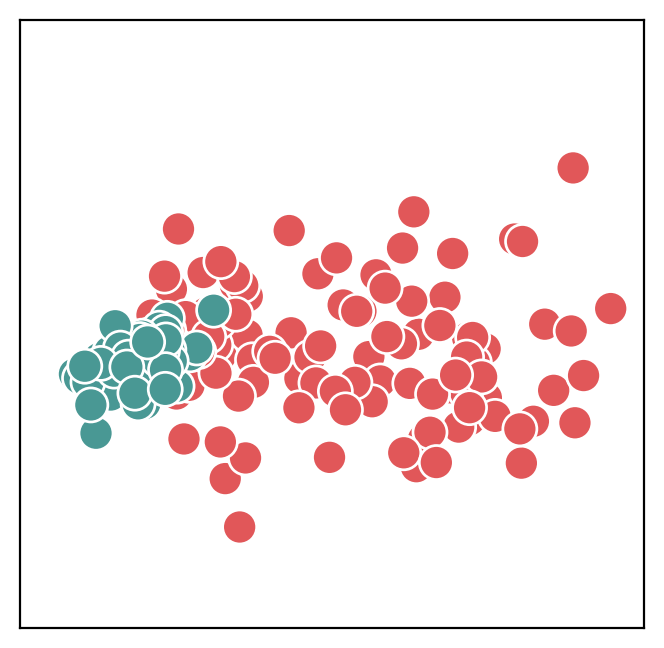

In [50]:
'''
X_pca_projection = pca.transform(Module_Dataframes_test['Combined'])
X_pca_projection = pd.DataFrame(X_pca_projection, index=Module_Dataframes_test['Combined'].index.tolist())
X_pca_projection = X_pca_projection.rename({0:'PCA 0', 1:'PCA 1',2:'PCA 2',3:'PCA 3', 4:'PCA 4'}, axis=1)
X_pca_projection['Kmeans_label'] = Km.predict(X_pca_projection)
X_pca_projection['Health Status'] = ind_health
'''
X_pca_projection = pd.read_csv('MolecularGroupPCA_Test.csv', index_col=0)
plt.figure()
ax = sns.scatterplot(x='PCA 0', y='PCA 1', hue='Health Status', data = X_pca_projection, s=150, palette=[colorrs[7], colorrs[3]])
ax.set(xlim=(-0.0025, 0.0042), ylim=(-0.0025, 0.004))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.xlabel("")
plt.ylabel("")
labels = [item.get_text() for item in ax.get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax.set_xticklabels(empty_string_labels)
ax.set_yticklabels(empty_string_labels)
ax.get_legend().remove()

In [51]:
# Name Molecular Group
X_pca_projection['Molecular_Group'] = X_pca_projection['Kmeans_label']
X_pca_projection['Molecular_Group'][X_pca_projection['Molecular_Group']==0] = 'Low'
X_pca_projection['Molecular_Group'][X_pca_projection['Molecular_Group']==1] = 'High'
tmp2['Molecular_Group'] = X_pca_projection['Molecular_Group']

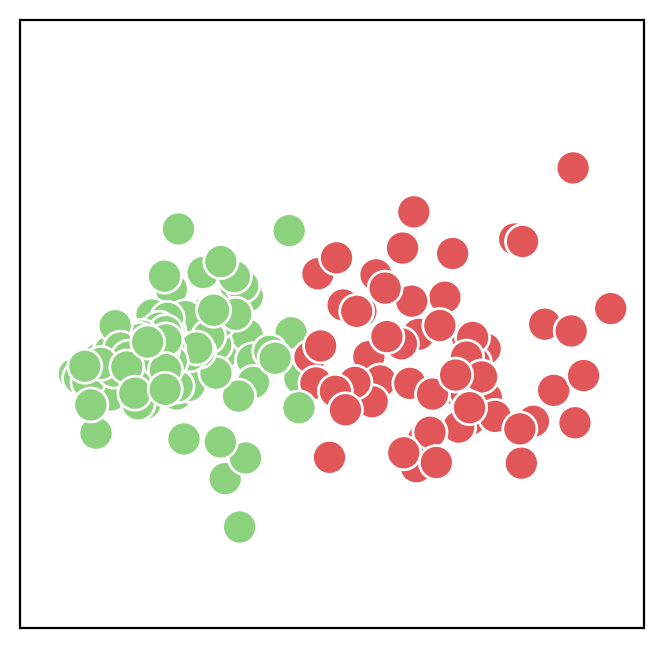

In [52]:
plt.figure()
ax = sns.scatterplot(x='PCA 0', y='PCA 1', hue='Molecular_Group',
                     data = X_pca_projection, s=150, palette=[colorrs[2], colorrs[7]])
ax.set(xlim=(-0.0025, 0.0042), ylim=(-0.0025, 0.004))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.xlabel("")
plt.ylabel("")
labels = [item.get_text() for item in ax.get_xticklabels()]
empty_string_labels = ['']*len(labels)
ax.set_xticklabels(empty_string_labels)
ax.set_yticklabels(empty_string_labels)
ax.get_legend().remove()
plt.savefig(figdir+"/{}.png".format('PCA_Kmeans_people_Test'), bbox_inches='tight')
plt.savefig(figdir+"/{}.pdf".format('PCA_Kmeans_people_Test'), bbox_inches='tight')

In [53]:
# Need to collaspe people on PC 1 for better visualization. 
# Otherwise heatmap looks like the last few people contribute the most to the signal.
X = Module_Dataframes_test['Combined']
X_min = X_pca_projection.sort_values('PCA 0')['PCA 0'].min()
X_max = X_pca_projection.sort_values('PCA 0')['PCA 0'].max()
steps = np.linspace(X_min, X_max, 25)
Average_PC1_frame = pd.DataFrame(index=X.columns.tolist())
for ii in range(len(steps)-1):
    avg_peeps = X_pca_projection.sort_values('PCA 0')['PCA 0'][(X_pca_projection.sort_values('PCA 0')['PCA 0'] >= steps[ii]) & (X_pca_projection.sort_values('PCA 0')['PCA 0'] <= steps[ii+1])].index.tolist()
    Average_PC1_frame[str(ii)] = X[X.index.isin(avg_peeps)].mean(axis=0)

Average_PC1_frame = Average_PC1_frame.rolling(window=4, min_periods=1, axis=1).mean()
Average_PC1_frame = Average_PC1_frame[Average_PC1_frame.index.isin(pd.read_csv('Top25CorrelatedGenes2PC1.csv', index_col=0).index.tolist())]
Average_PC1_frame = Average_PC1_frame.reindex(pd.read_csv('Top25CorrelatedGenes2PC1.csv', index_col=0).index.tolist())

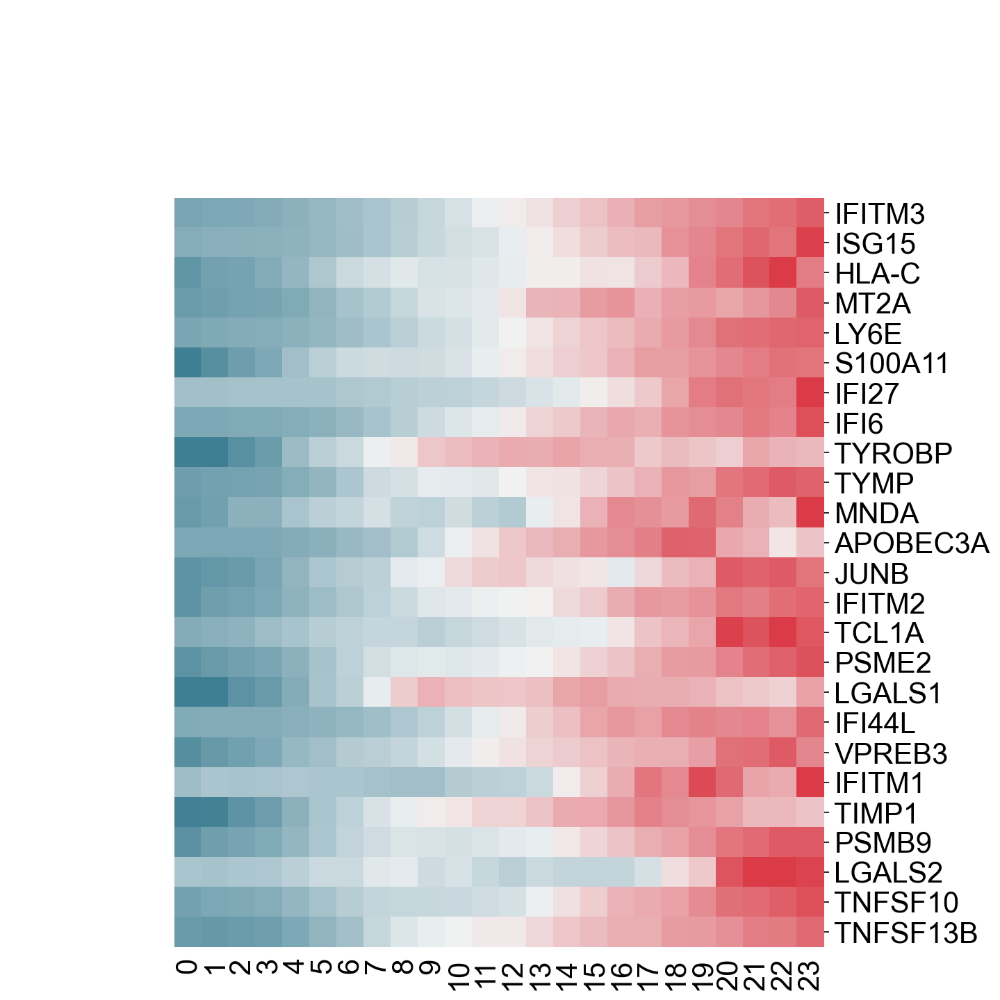

In [54]:
sc.settings.set_figure_params(dpi=75, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=20)
g = sns.clustermap(Average_PC1_frame, method ='complete', cmap=cmap,
               center=0, yticklabels=1, xticklabels=1, z_score=0,
               row_cluster=False, col_cluster=False,vmin=-2, vmax=2, cbar_pos=None)
ax = g.ax_heatmap
ax.set_ylabel('')
plt.savefig(figdir+'/'+'{}.png'.format('Genes across PC1 Test'), bbox_inches='tight')
plt.savefig(figdir+'/'+'{}.pdf'.format('Genes across PC1 Test'), bbox_inches='tight')

# Compute Odds ratios

In [55]:
# High Molecular Group(1) vs. Low Molecular Group(2)
Clin_OR = pd.DataFrame(index=tmp2['Clinical_Feature'].unique().tolist(), columns=['Odds Ratio', 'p'])
for clinvar in tmp2['Clinical_Feature'].unique().tolist():
    try:
        a = len(tmp2[(tmp2['Molecular_Group'].isin(['High'])) & (tmp2['Clinical_Feature']==clinvar) & (tmp2['value']==1)])
        b = len(tmp2[(tmp2['Molecular_Group'].isin(['High'])) & (tmp2['Clinical_Feature']==clinvar) & (tmp2['value']==0)])
        c = len(tmp2[(tmp2['Molecular_Group'].isin(['Low'])) & (tmp2['Clinical_Feature']==clinvar) & (tmp2['value']==1)])
        d = len(tmp2[(tmp2['Molecular_Group'].isin(['Low'])) & (tmp2['Clinical_Feature']==clinvar) & (tmp2['value']==0)])
        table = [[a,b],[c,d]]
        oddsratio, pvalue = stats.fisher_exact(table)
        Clin_OR.loc[clinvar]['Odds Ratio'] = oddsratio
        Clin_OR.loc[clinvar]['p'] = pvalue
    except:
        continue
Clin_OR = Clin_OR.sort_values('Odds Ratio', ascending=False)
Clin_OR = Clin_OR.reset_index()
Clin_OR = Clin_OR.replace([np.inf, -np.inf], np.nan).dropna()
display(Clin_OR)

,index,Odds Ratio,p
1,anti-Smith,5.503448,0.001208
2,anti-dsDNA,2.684211,0.023158
3,Renal involvement,2.022222,0.142257
4,Discoid Rash,1.857143,0.372748
5,Lymphopenia,1.498623,0.497069
6,Malar Rash,1.304348,0.537492
7,Photosensitivity,1.244444,0.671046
8,Leukopenia,1.233974,0.798496
9,Arthritis,1.041270,1.000000
10,Low Complement,1.004630,1.000000


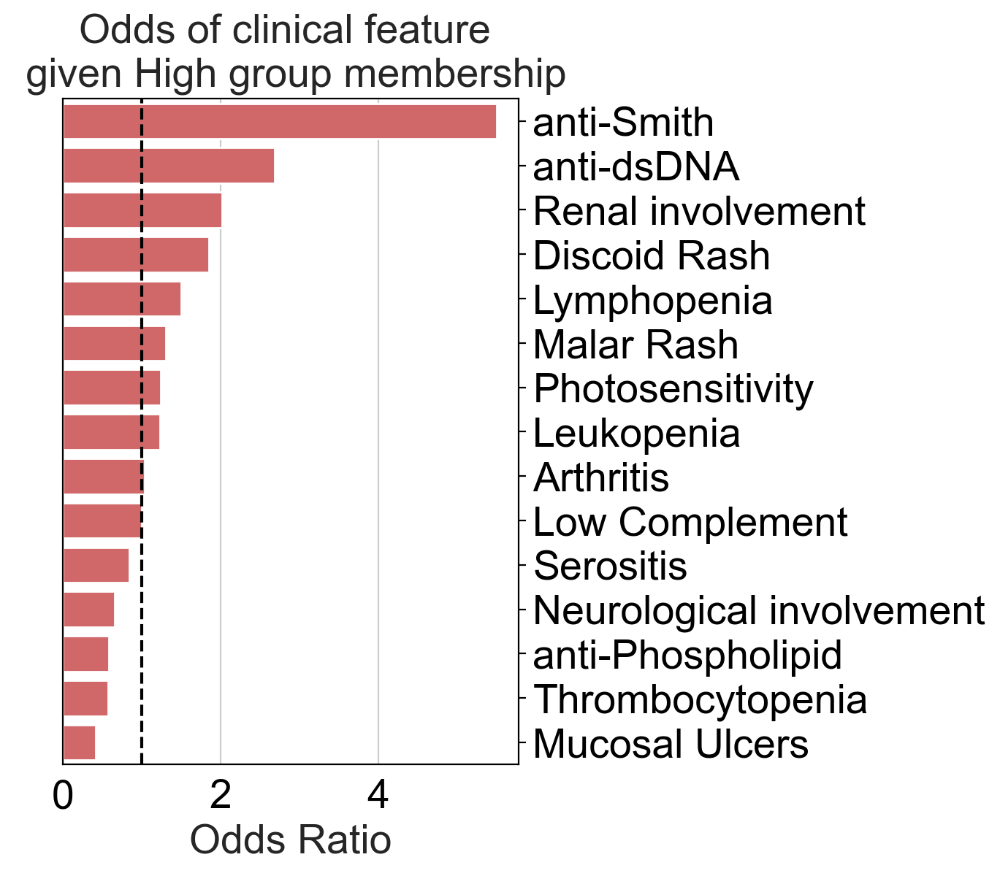

In [56]:
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='png', frameon=False, transparent=True, fontsize=20)
# Odds ratio
plt.figure(figsize=(4, 6))
ax=sns.barplot(y='index', x='Odds Ratio', data=Clin_OR, color=colorrs[7])
ax.yaxis.set_ticks_position('right')
plt.axvline(x=1, ls='--', color='k')
plt.ylabel("")
plt.xlabel('Odds Ratio', fontsize=20)
plt.title('Odds of clinical feature \n given High group membership')
plt.savefig(figdir+'/'+'{}.png'.format('OddsRatio_Clinical_High_Group'), bbox_inches='tight')
plt.show()

# Predict out of sample each clinical variable

In [57]:
def logistic_regression_clincal_groups(All_tmp, ii, COLOR, skip_coefficient=False):
    from sklearn.model_selection import StratifiedKFold
    from sklearn.decomposition import PCA
    from imblearn.over_sampling import SMOTE
    from sklearn.linear_model import LogisticRegression
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    from sklearn.metrics import auc
    sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png',
                                  frameon=False, transparent=True, fontsize=22)

    # Dependent variable
    All_Y = All_tmp['clinical'].values.ravel()
    # Remove dependent variable from variables
    All_X = All_tmp.drop('clinical', axis=1)
    # Collect Features
    features = np.asarray(All_X.columns.tolist())
    # observations x features
    All_X = All_X.values

    # Cross Validation
    cv = StratifiedKFold(n_splits=3, shuffle=False)
    
    tprs = []; aucs = []; mean_fpr = np.linspace(0, 1, 100); fig, ax = plt.subplots()
    coefficients = {}
    for i, (train, test) in enumerate(cv.split(All_X, All_Y)):
        # Assign Train Set
        X_train = All_X[train].copy()
        Y_train = All_Y[train].copy()
        # Assign Test Set
        X_test = All_X[test].copy()
        Y_test = All_Y[test].copy()
        
        # Scale Train features between 0 and 1 and transform Test features.
        X_scale = preprocessing.MaxAbsScaler().fit(X_train)
        X_train = X_scale.transform(X_train)
        X_test  = X_scale.transform(X_test)

        # Run classifier with cross-validation and plot ROC curves
        classifier = LogisticRegression(max_iter=20000, penalty='elasticnet', solver='saga', l1_ratio=0.5)
        classifier.fit(X_train, Y_train)
        coefficients[i] = np.ravel(classifier.coef_)
        
        # ROC area under the curve
        logit_roc_auc = roc_auc_score(Y_test, classifier.predict(X_test))
        aucs.append(logit_roc_auc)
        # Collect True and False Positive rates
        fpr, tpr, _ = roc_curve(Y_test, classifier.predict_proba(X_test)[:,1], drop_intermediate=False)
        interp_tpr = np.interp(mean_fpr, fpr, tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
    

    # Plot chance line.
    ax.plot([0, 1], [0, 1], linestyle='--', lw=1, color='k', alpha=1)
    # Mean TPR
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color=COLOR,
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=4, alpha=1)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color=COLOR, alpha=.05,
                    label=r'$\pm$ 1 std. dev.')
    ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
           title=r'Mean AUC = %0.2f $\pm$ %0.2f ' % (mean_auc, std_auc))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.savefig(figdir+'/'+'{}.png'.format('K-Means_ROC_{}'.format(ii)), bbox_inches='tight')
    plt.show()
    if skip_coefficient ==  False:
    # Plot coefficient barplot
        tmp0 = ((np.abs(pd.DataFrame(coefficients))>0)*1).sum(axis=1)
        tmp0 = tmp0[tmp0>1].index.tolist() # Features has to be used in 2/3 cross validations...
        coef = pd.DataFrame(pd.DataFrame(coefficients).mean(axis=1)[tmp0].values,
                            index=features[tmp0], columns=['coefficient'])

        coef['Odds Ratio'] = np.exp(coef['coefficient'])
        coef['Absolute_value'] = coef['coefficient'].abs()
        coef = coef.sort_values('Absolute_value', ascending=False)[:10]
        coef = coef.reset_index()
        coef = coef.sort_values('coefficient', ascending=False)
        coef["ID"] = coef["index"]
        plt.figure(figsize=(4, 4))
        ax=sns.barplot(y='index', x='Odds Ratio', data=coef, color=COLOR)
        ax.yaxis.set_ticks_position('right')
        plt.axvline(x=1, ls='--', color='k')
        plt.ylabel("")
        plt.xlabel('Odds Ratio', fontsize=22)
        plt.savefig(figdir+'/'+'{}.png'.format('K-Means_ROC_coefficients_{}'.format(ii)), bbox_inches='tight')
        plt.show()

    return coefficients, features, mean_auc


anti-dsDNA


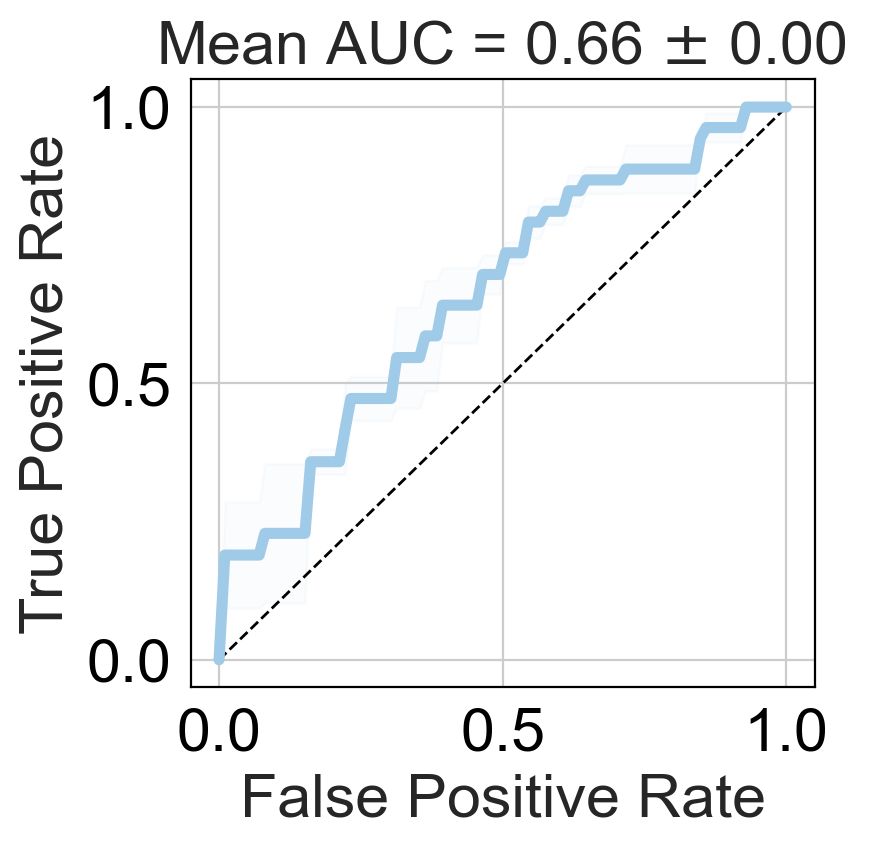

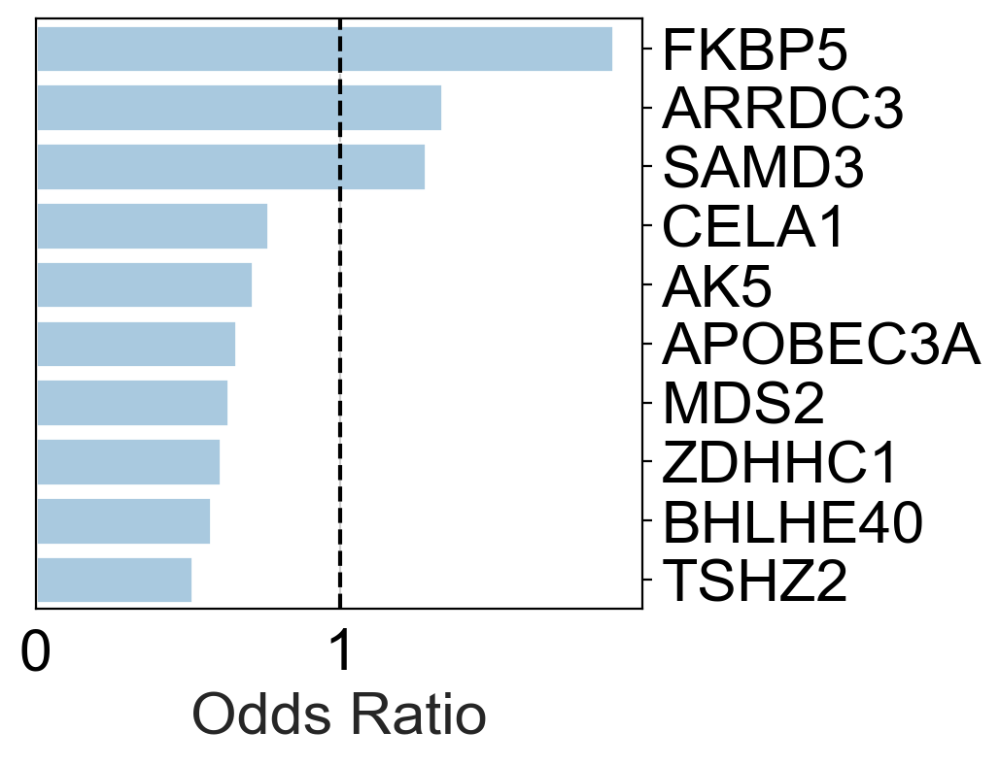

Malar Rash


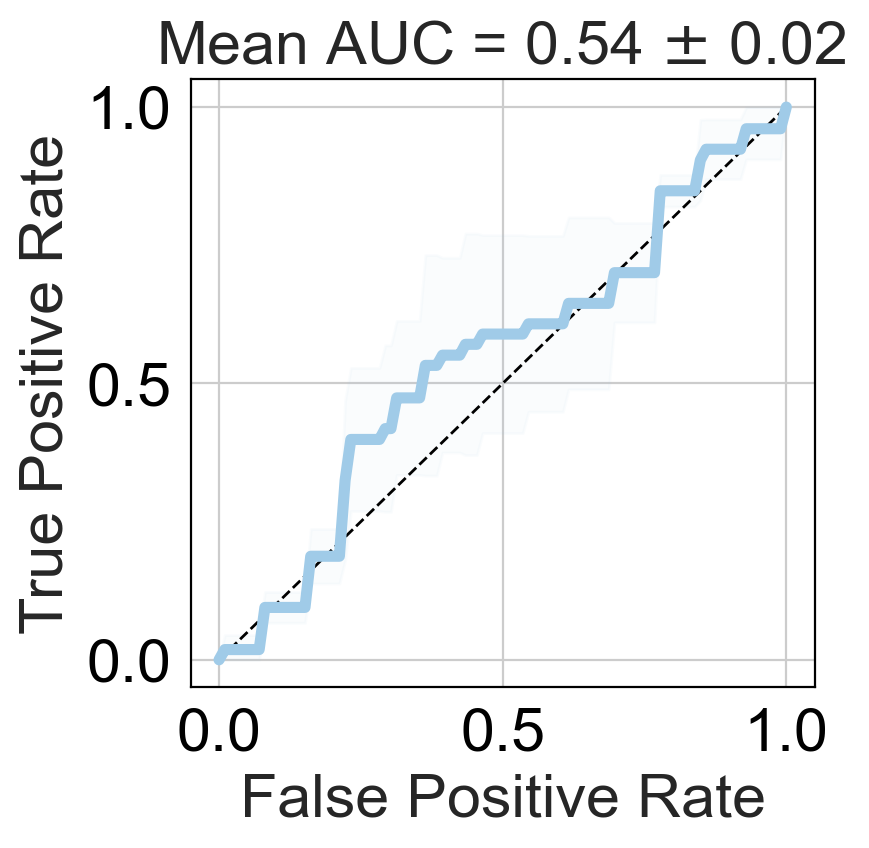

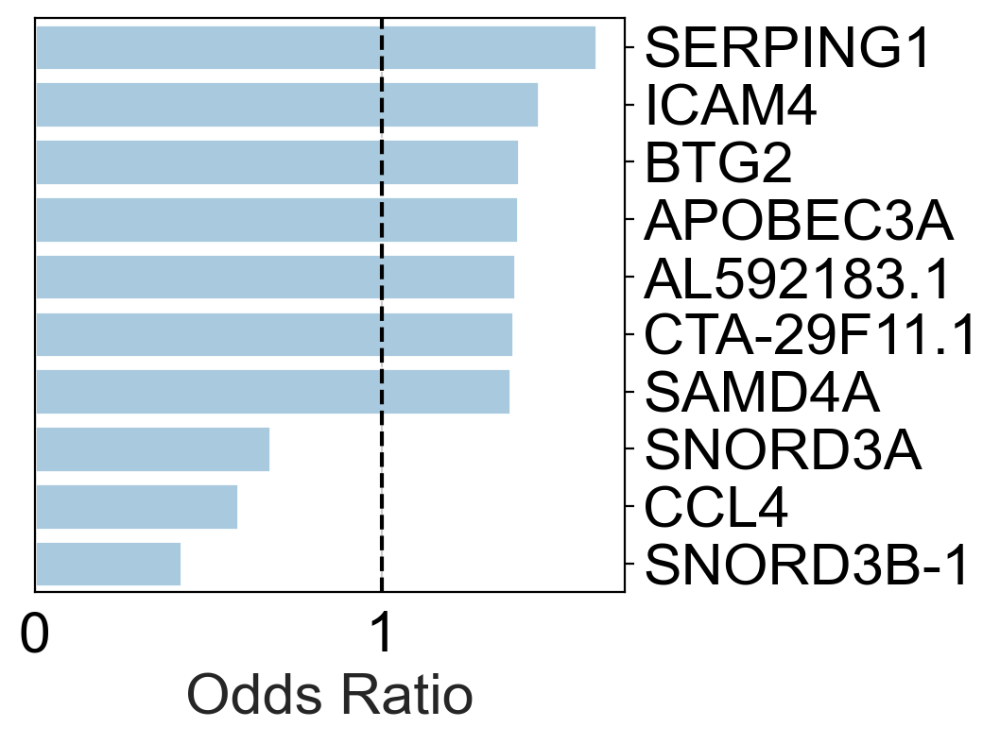

Renal involvement


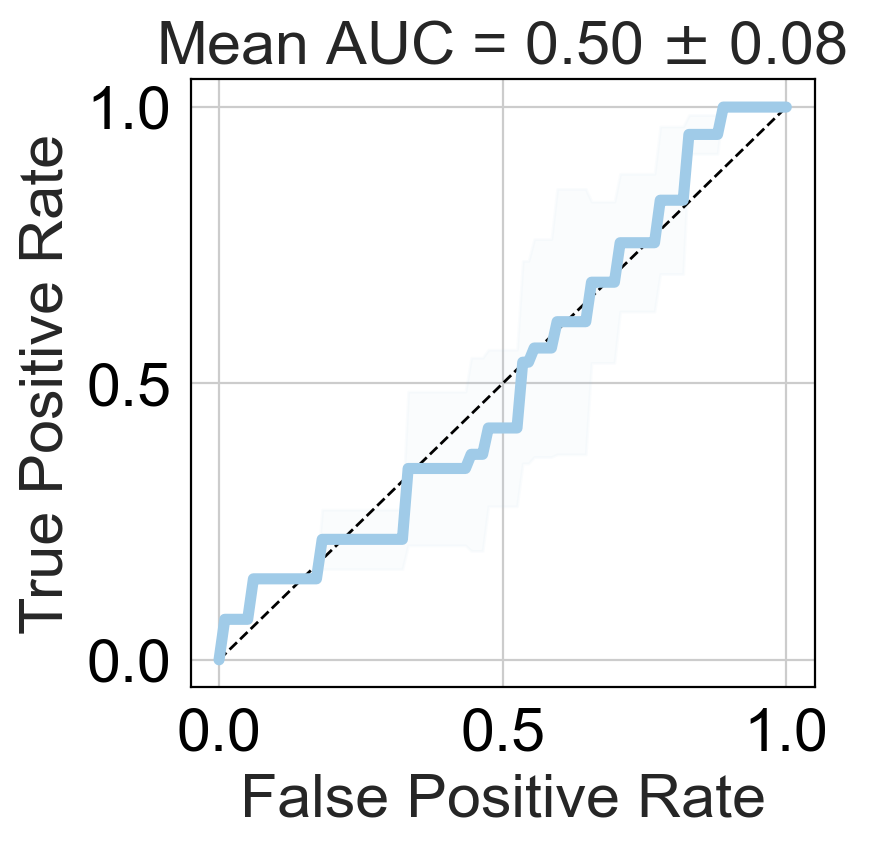

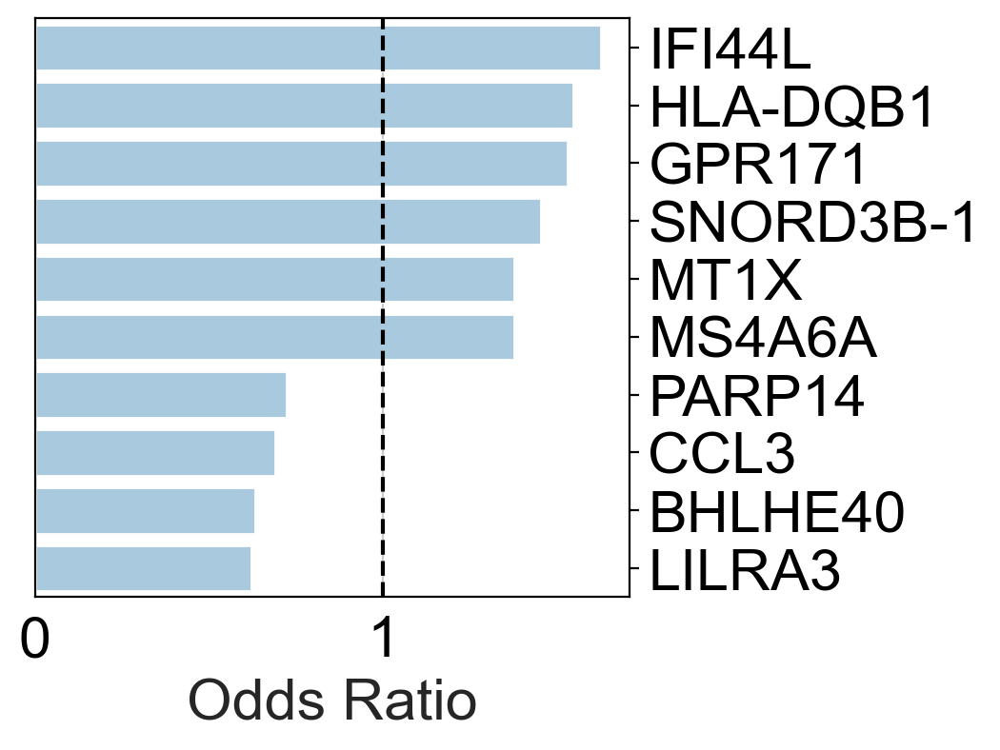

Photosensitivity


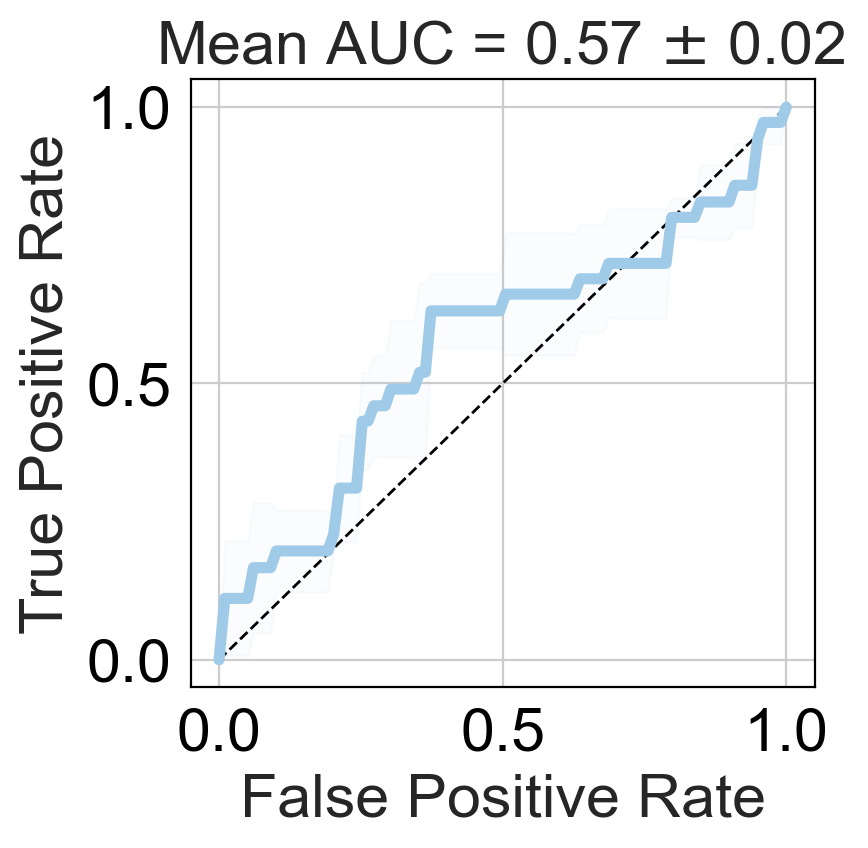

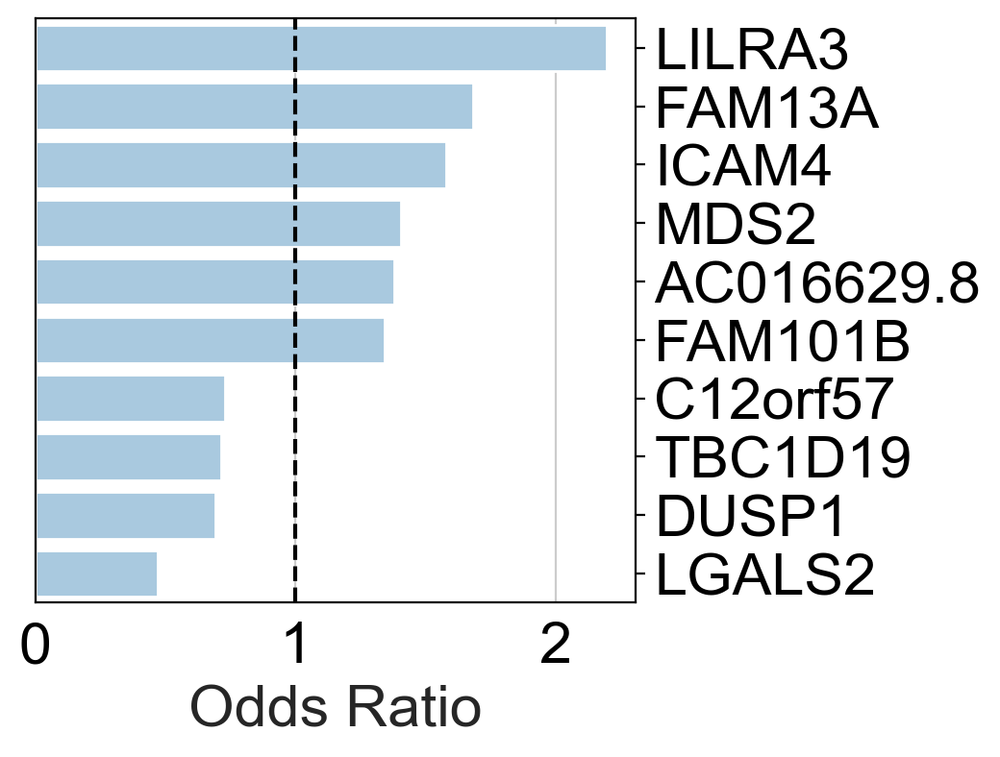

Mucosal Ulcers


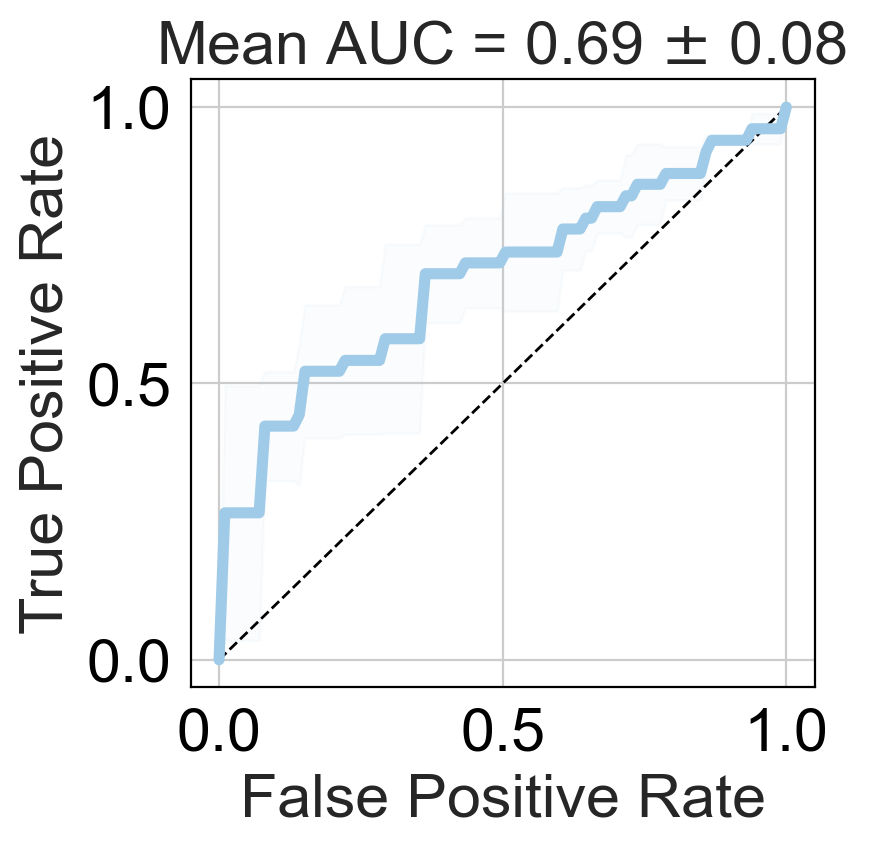

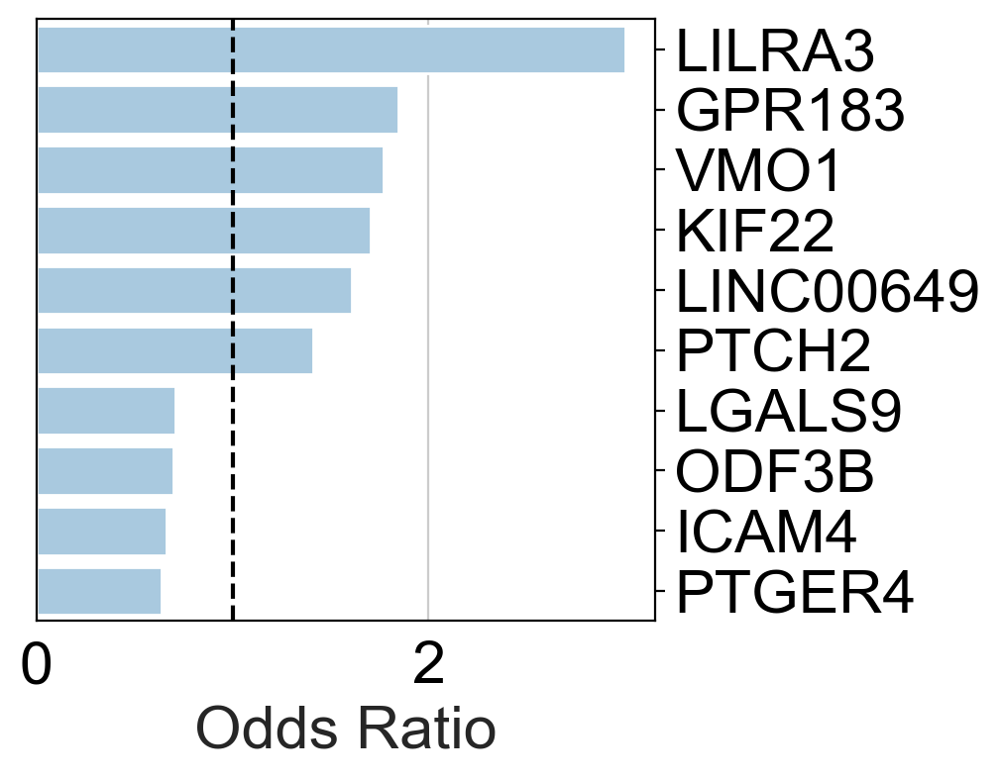

Discoid Rash


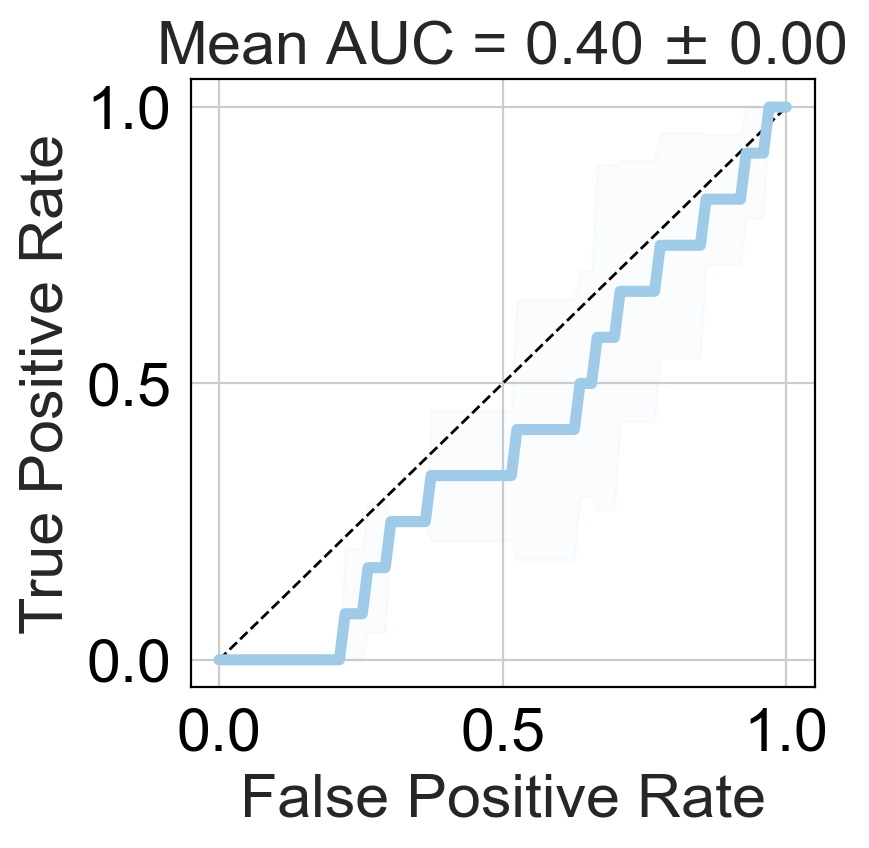

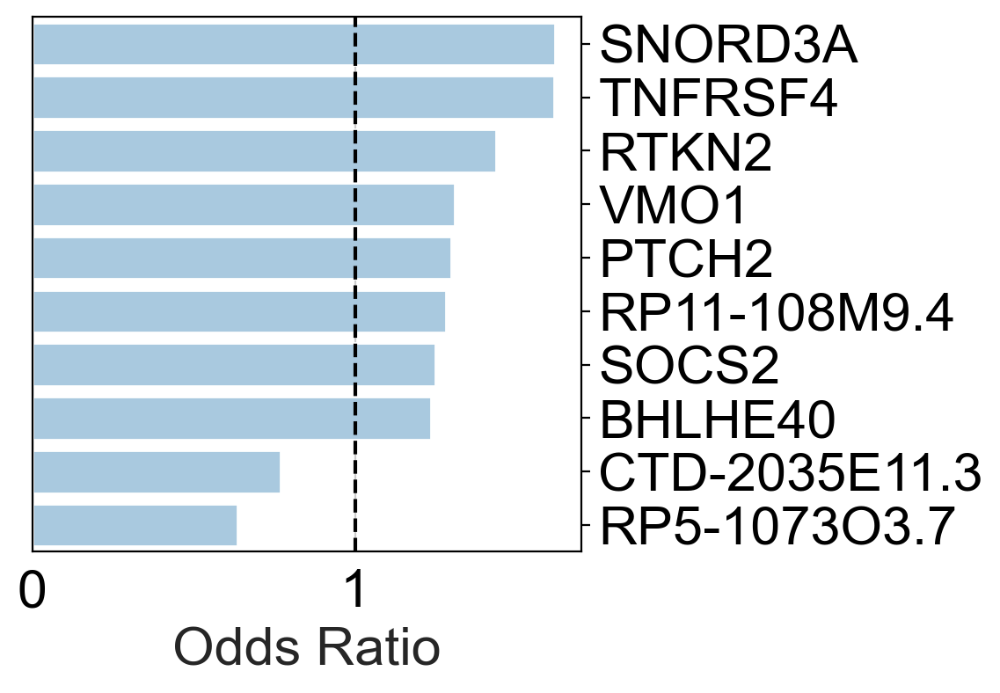

Leukopenia


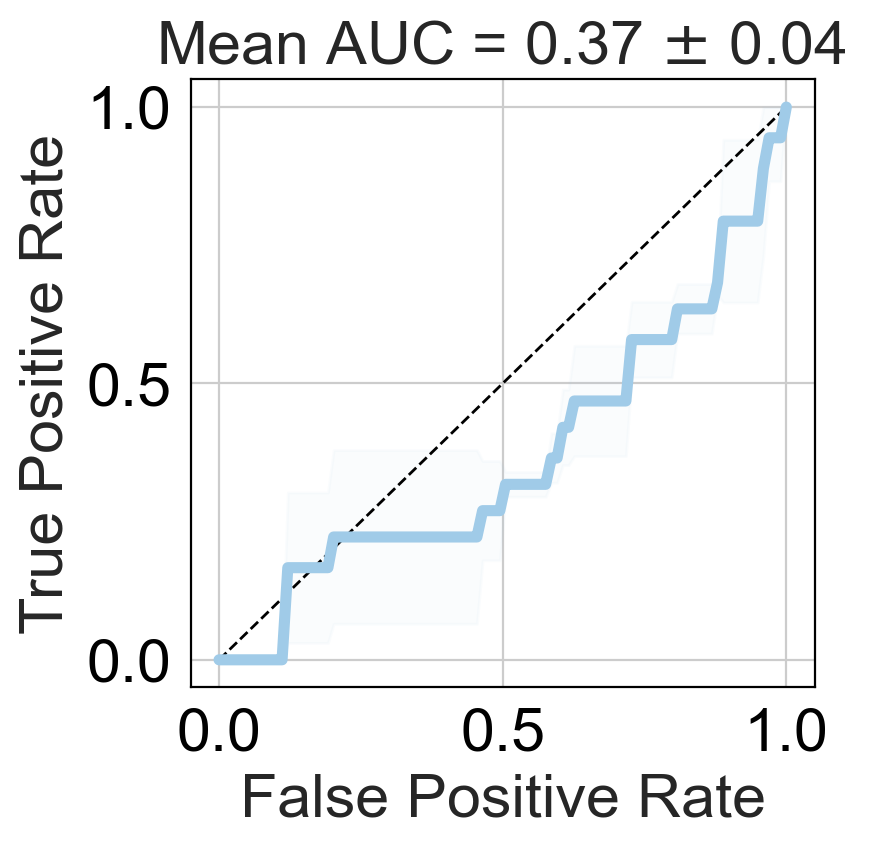

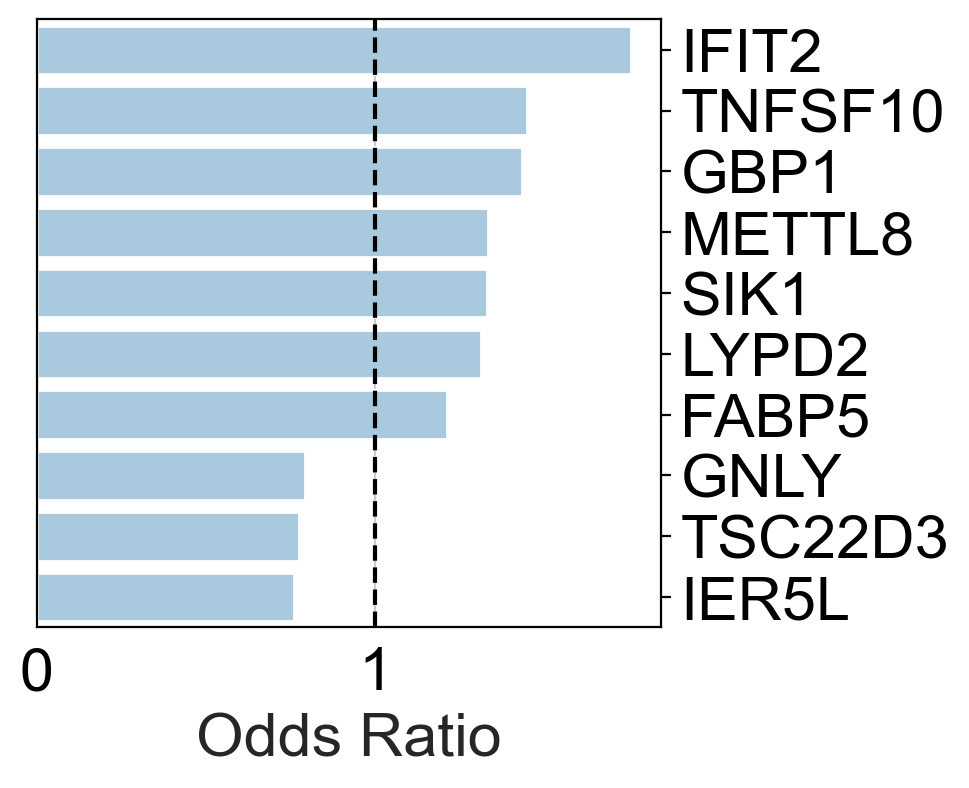

anti-Smith


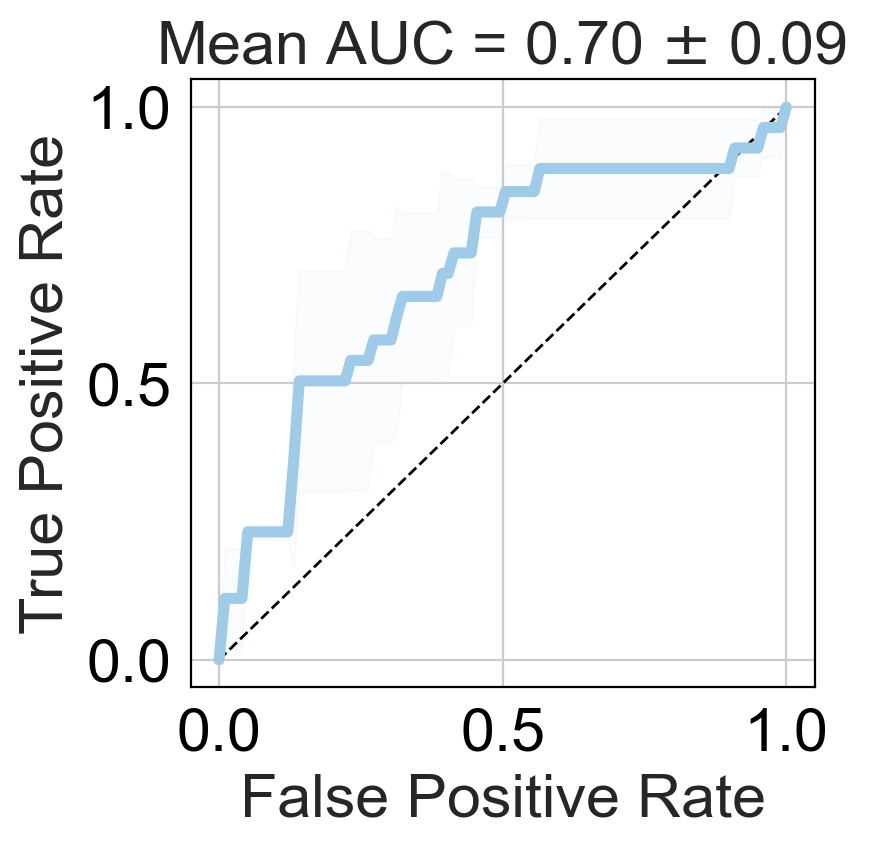

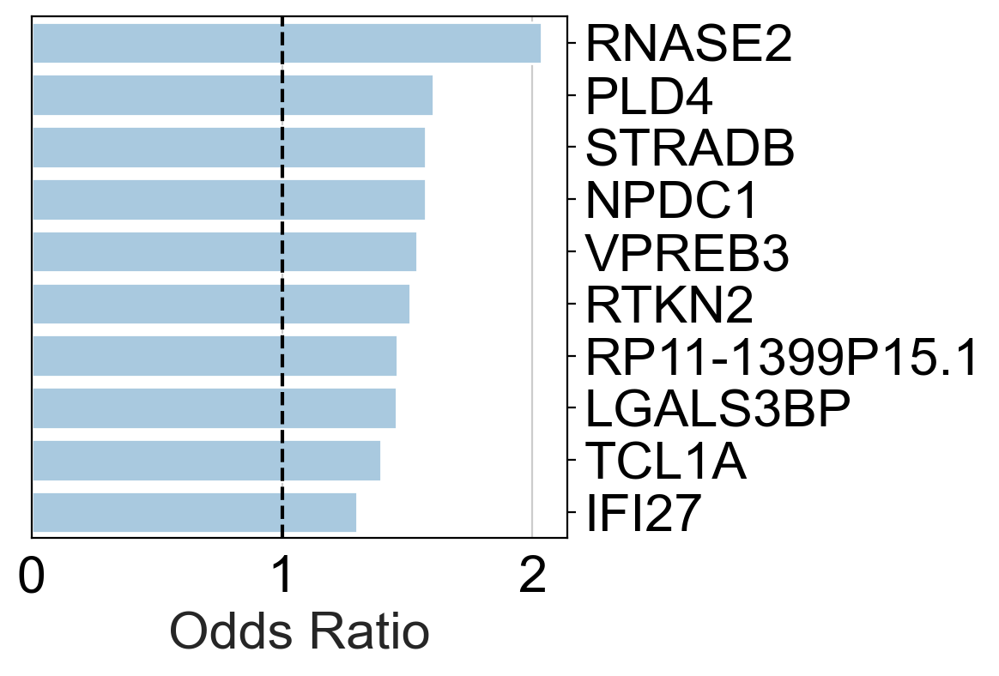

Low Complement


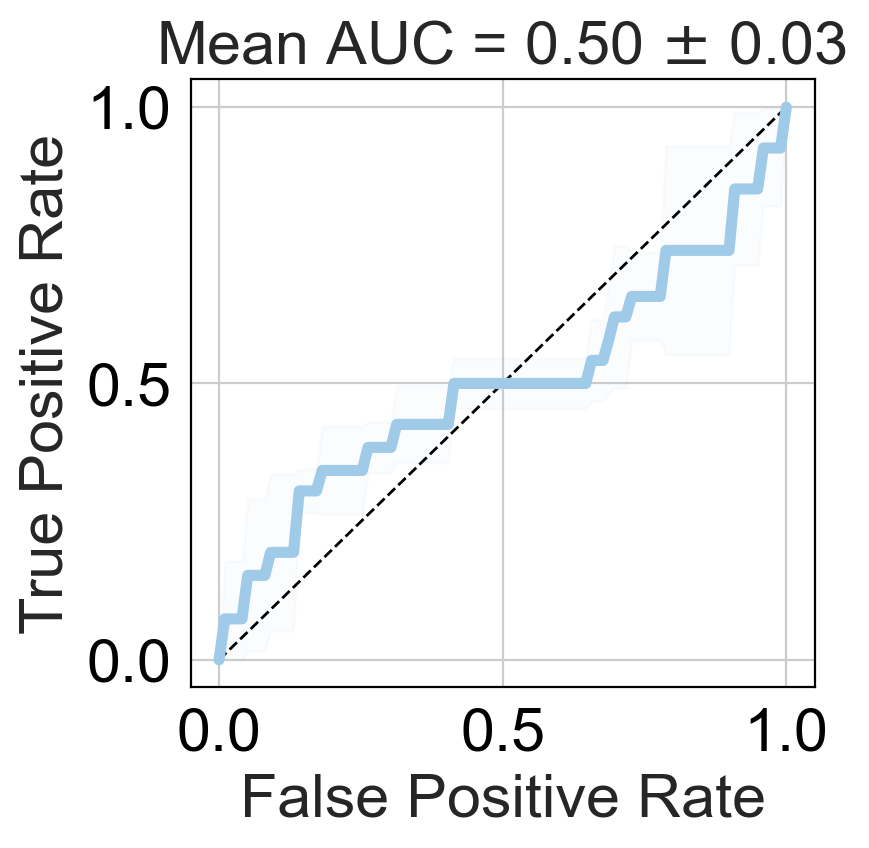

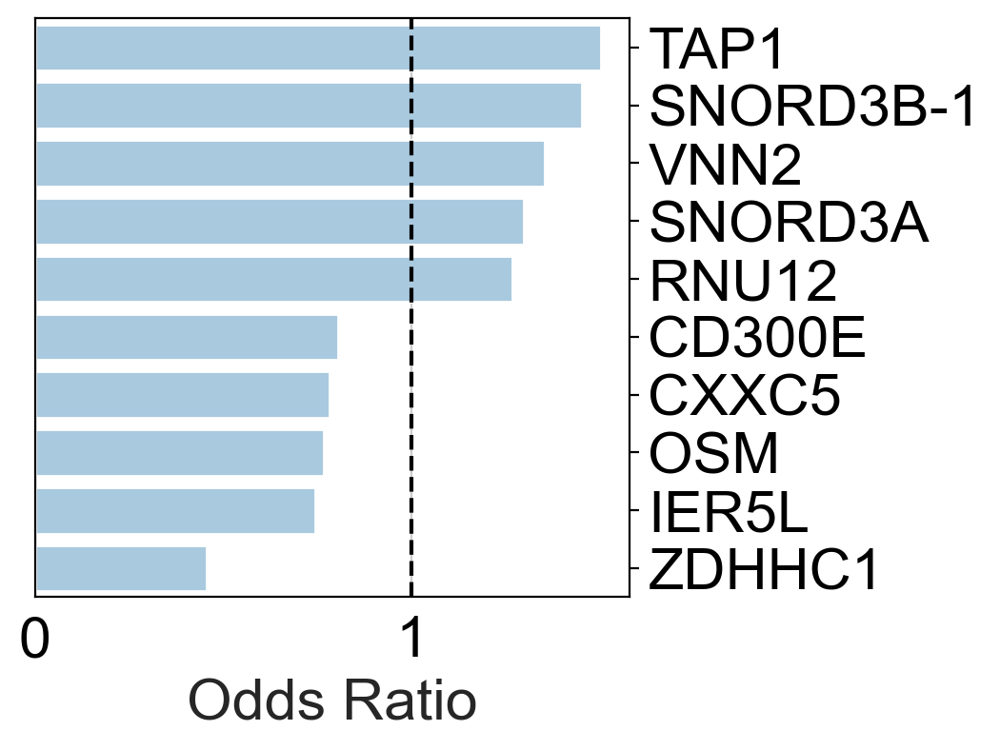

Serositis


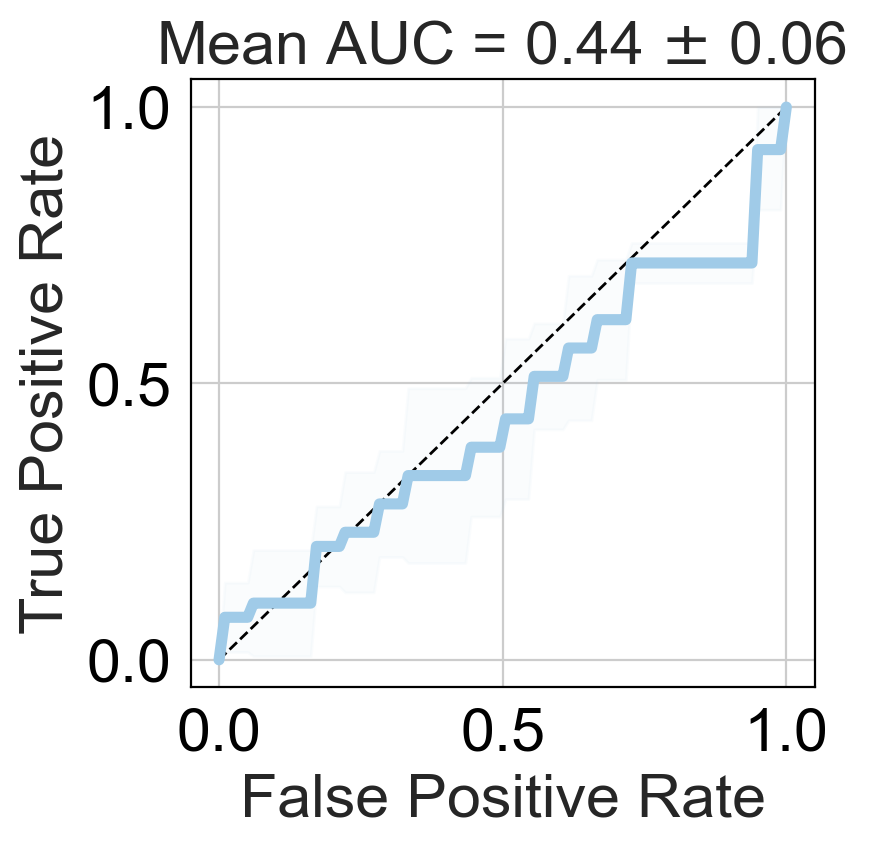

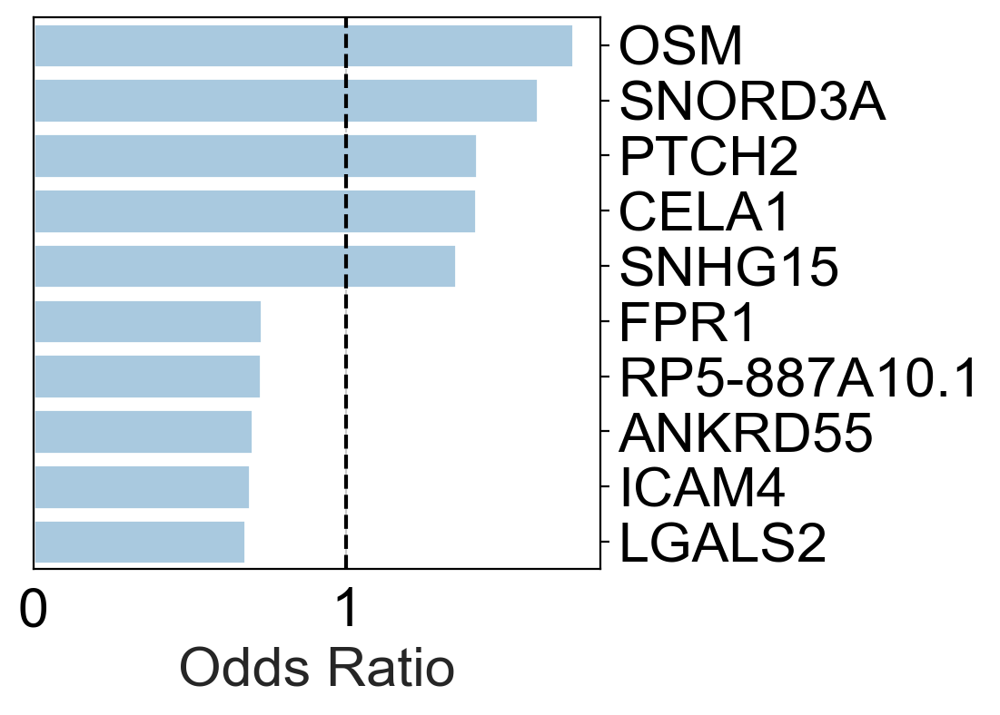

Lymphopenia


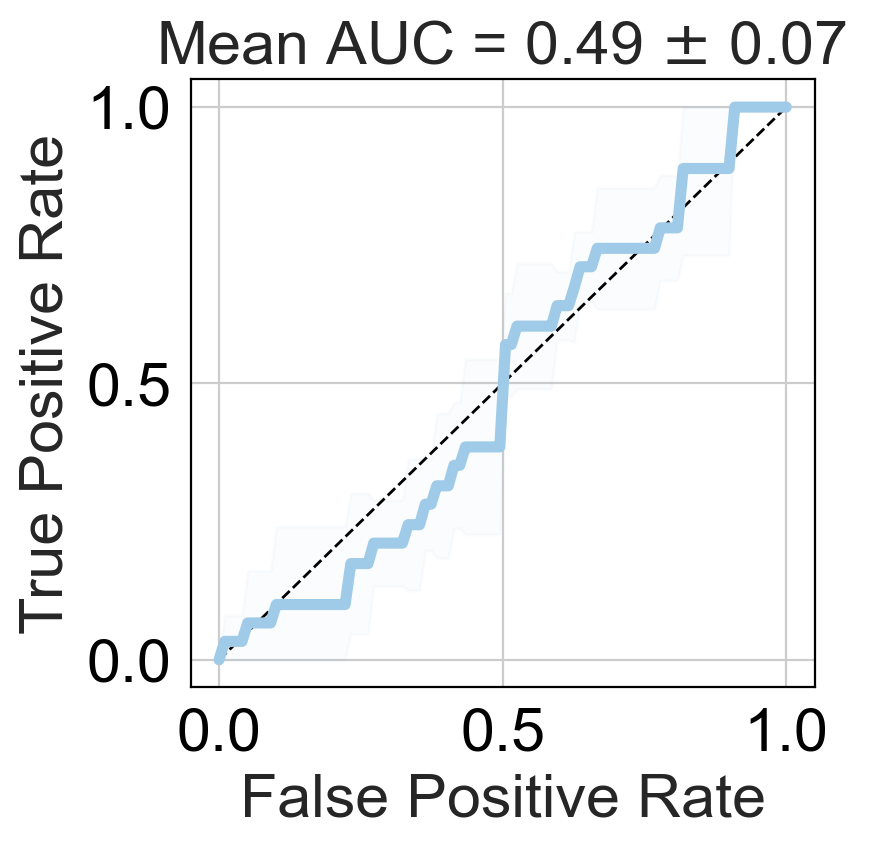

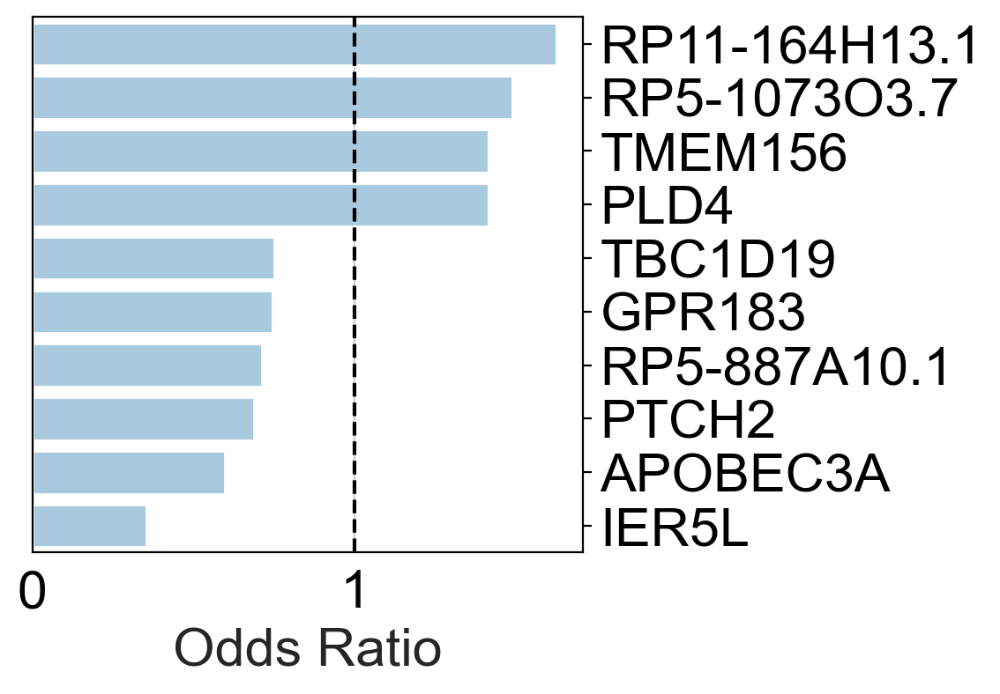

anti-Phospholipid


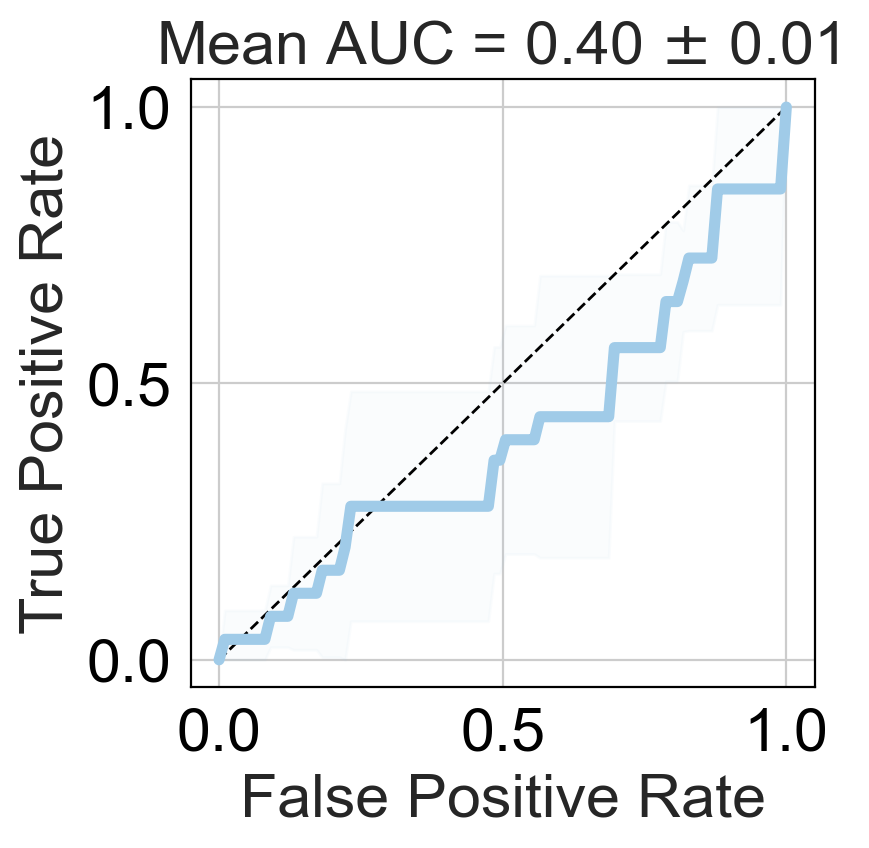

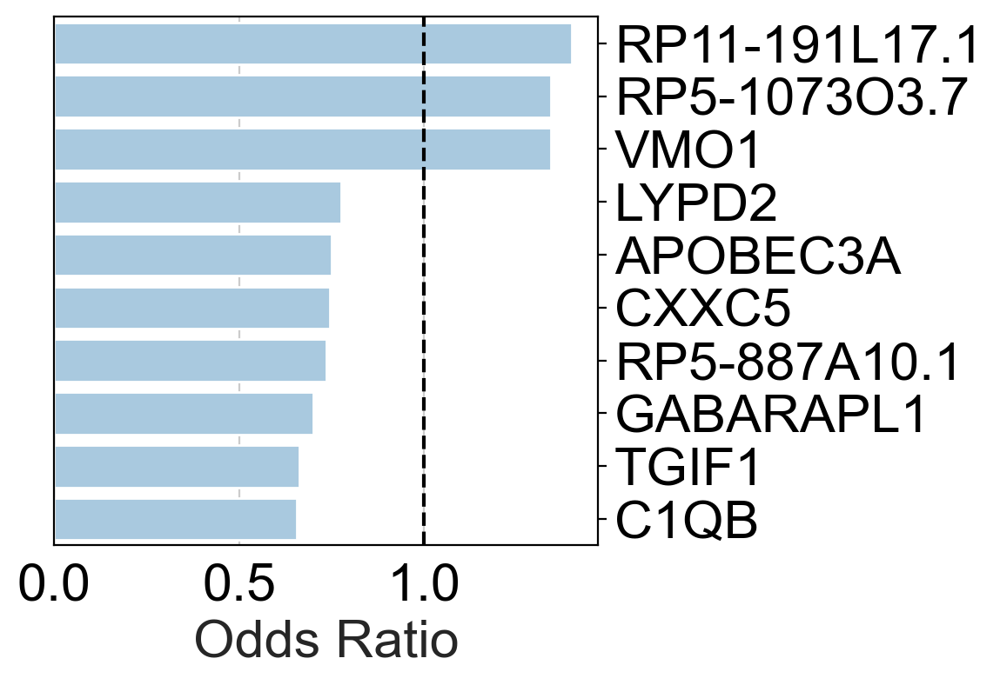

anti-ANA


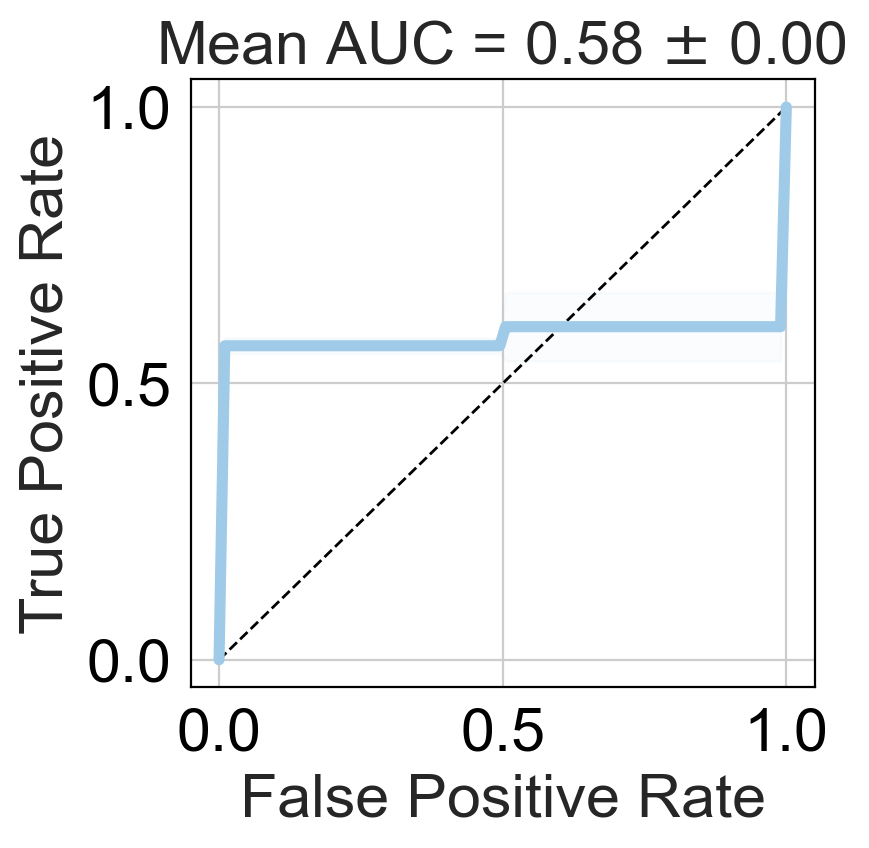

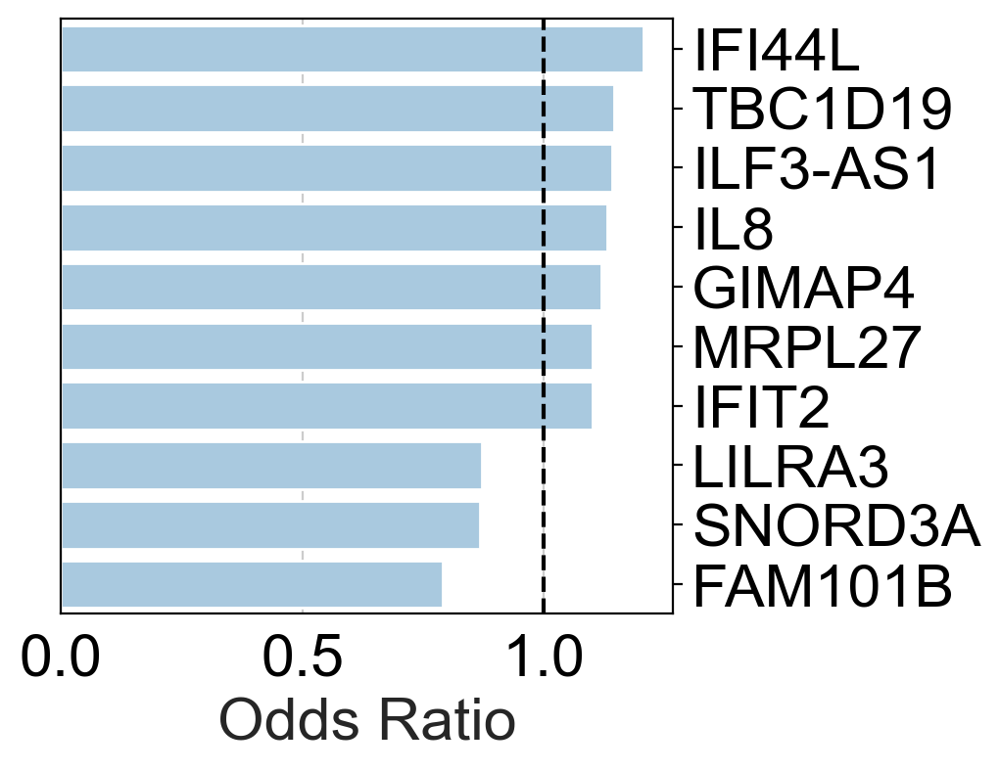

Neurological involvement


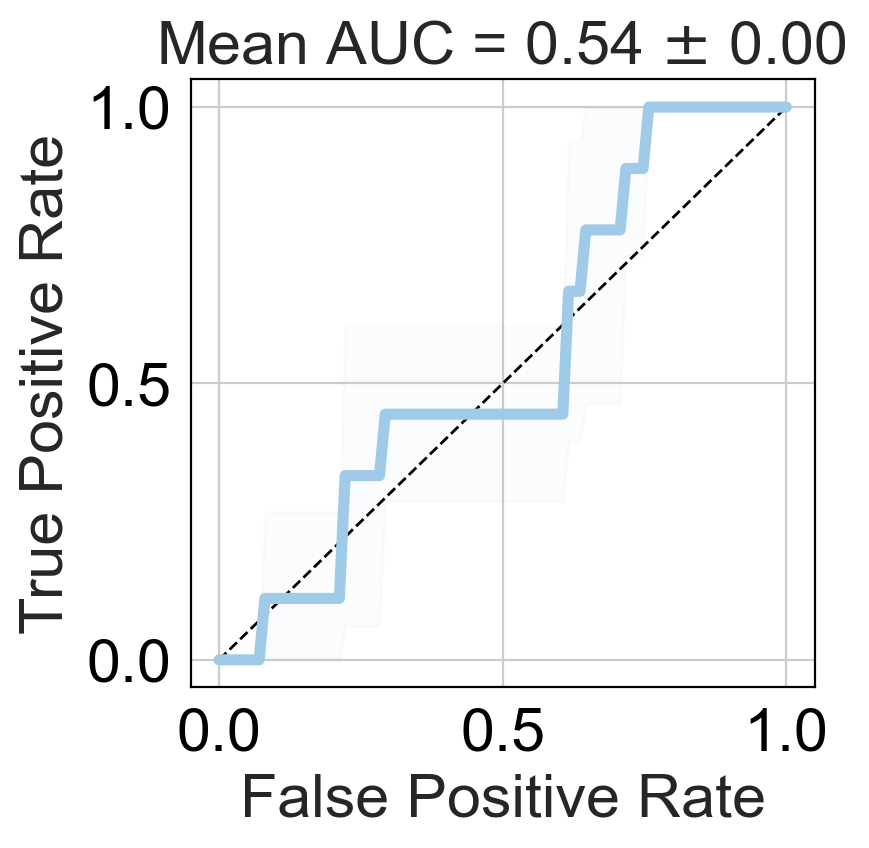

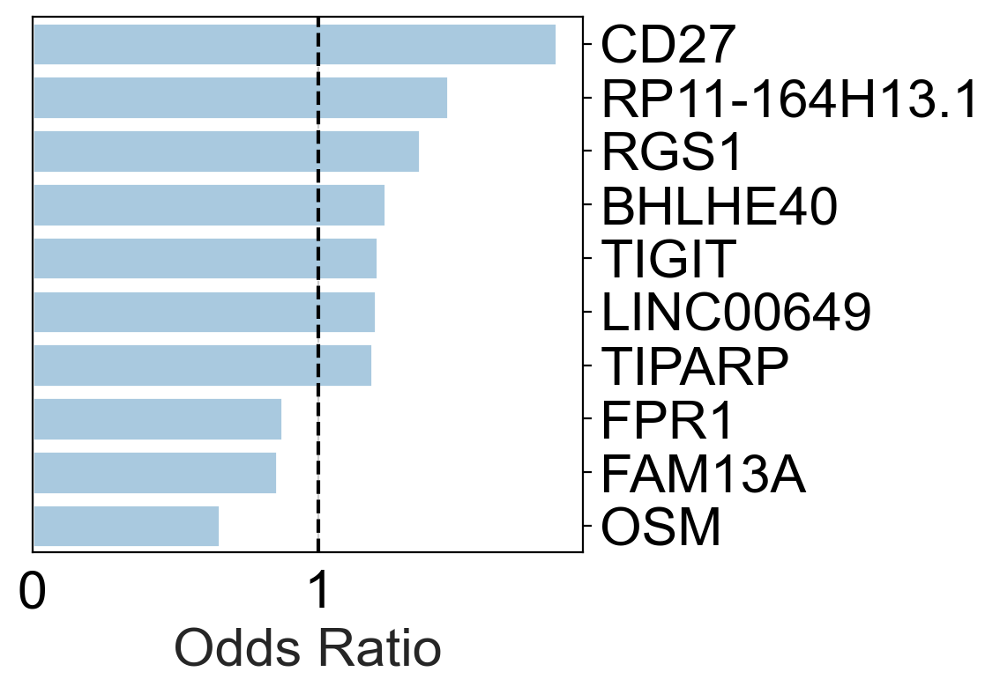

Arthritis


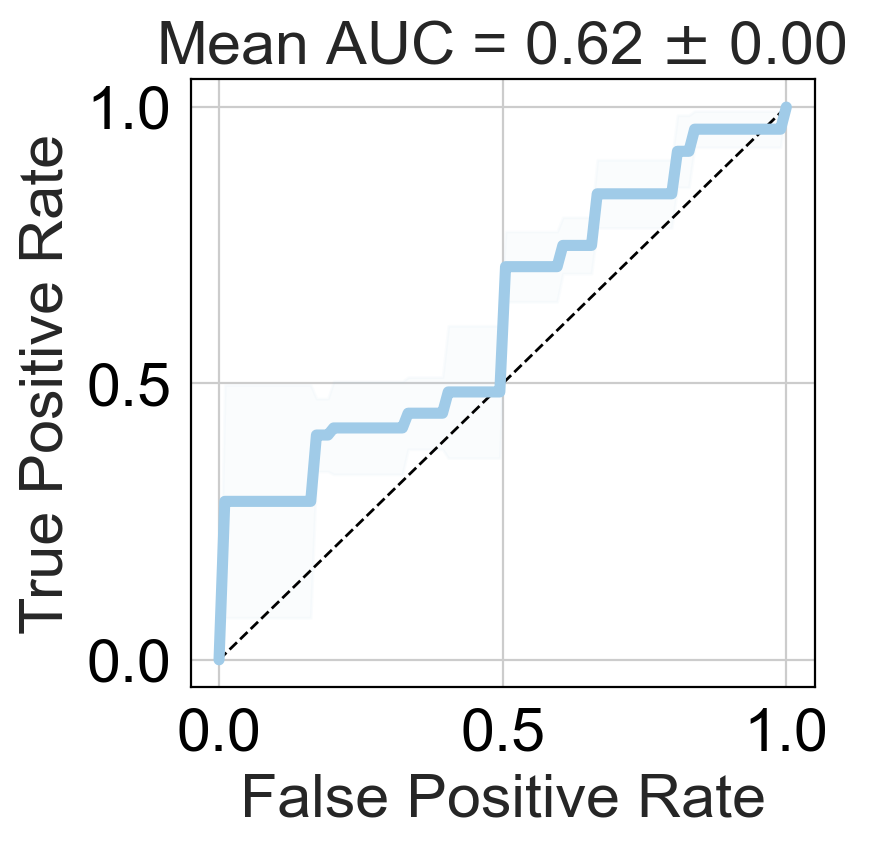

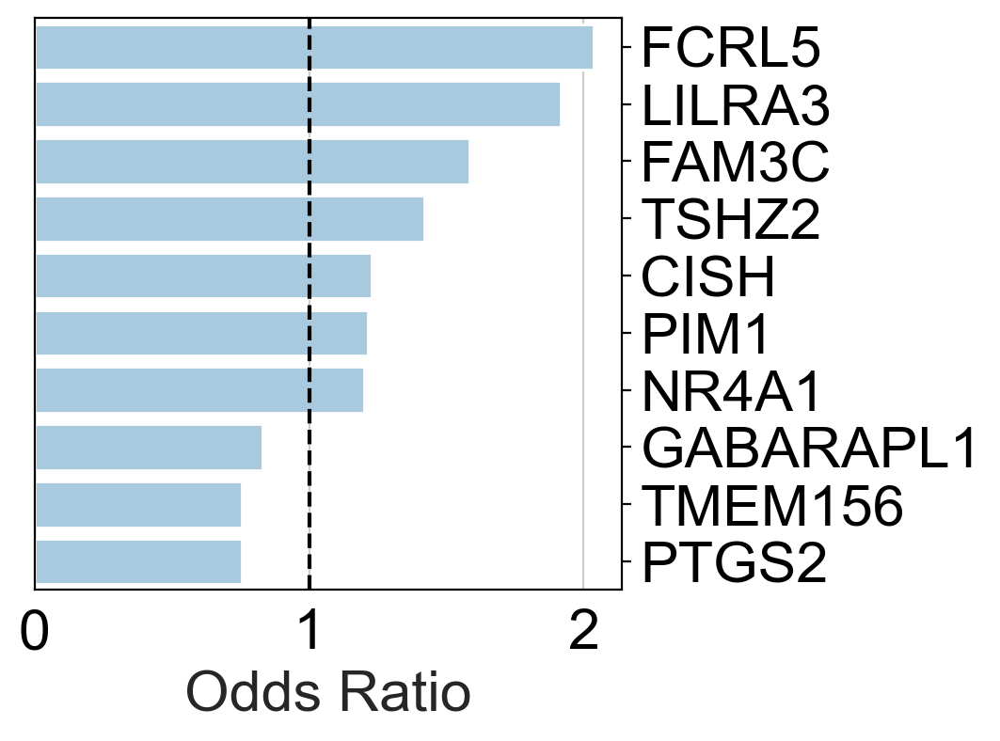

Thrombocytopenia


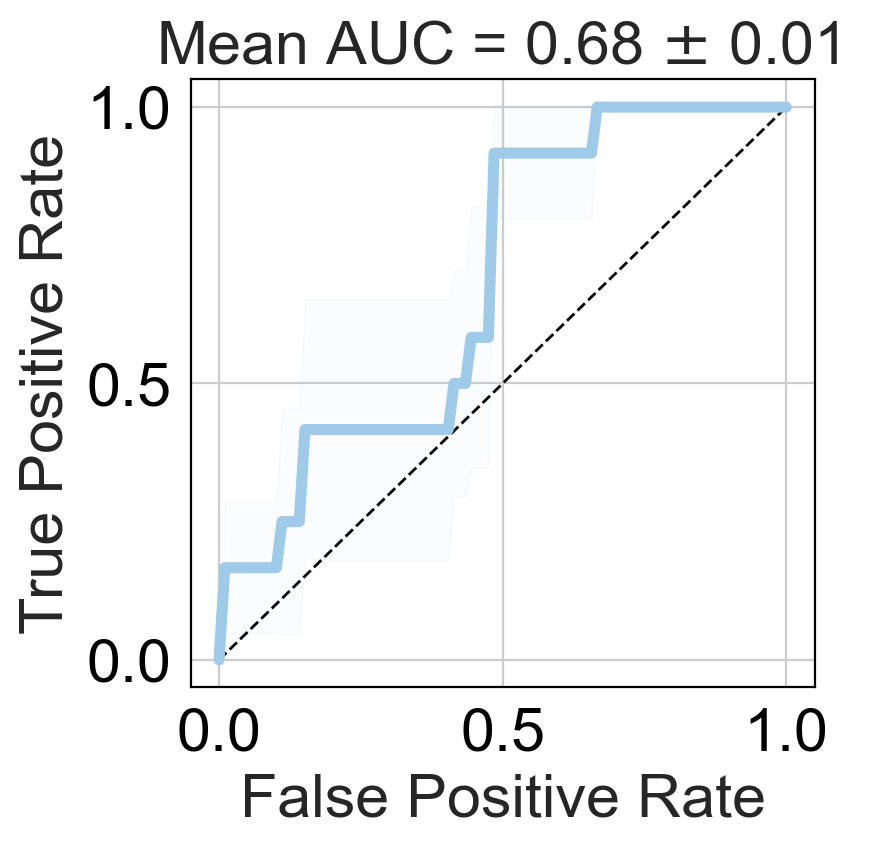

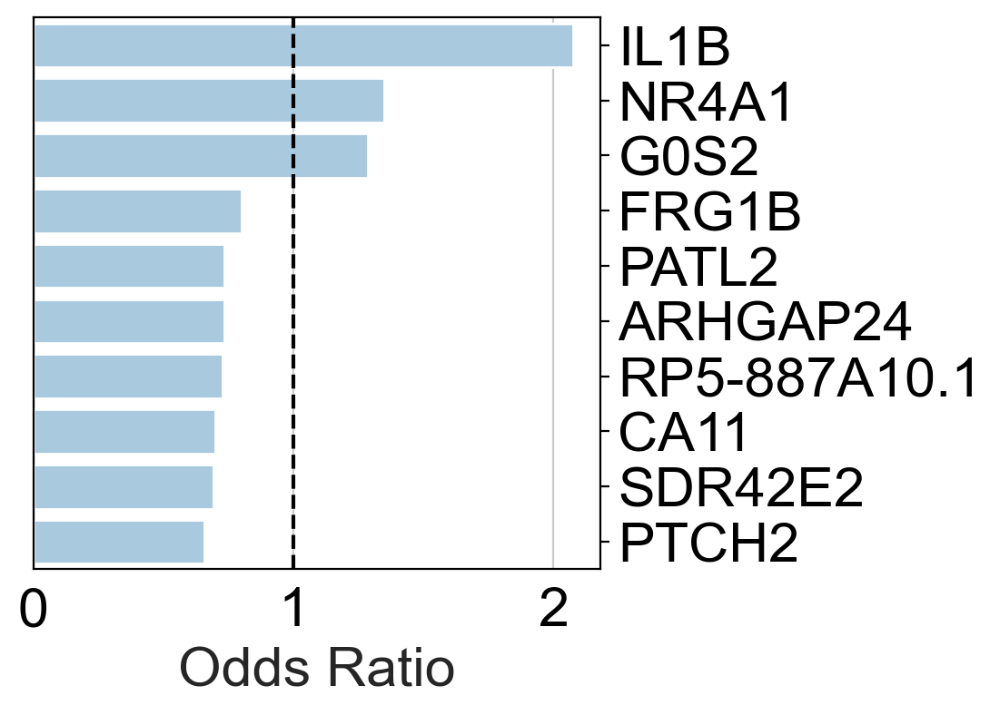

In [58]:
def prepare_data(dataframe, ii, tmp):
    dataframe = dataframe.copy()
    dataframe['clinical'] = (tmp[feature]==1)*1
    dataframe = dataframe.dropna(axis=0)
    return dataframe

features = CS_SLEDAI_test.columns.tolist()
for feature in features:
    print(feature)
    module = Module_Dataframes_test['Combined'].copy()
    All_tmp = prepare_data(module, ii, CS_SLEDAI_test)
    coefficients, features, AUC = logistic_regression_clincal_groups(All_tmp, feature, colorrs[1])
